In [5]:
# =============================
# YOLO IMAGE ANALYSIS - INITIALIZATION
# =============================
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import glob
import re
import json

# Torch / Deep Learning
import torch
import torchvision
import torch.nn.functional as F
from torchvision import transforms

# Scikit-Image for advanced image processing
from skimage import filters, feature, measure, morphology

# YOLOv8
from ultralytics import YOLO

# File Picker (Tkinter) and PIL
from tkinter import Tk, filedialog
from PIL import Image

# Set random seed for reproducibility
np.random.seed(42)

# ============================================================================
# DIRECTORY STRUCTURE SETUP
# ============================================================================
# Base directories
BASE_DIR = os.path.dirname(os.path.abspath(__file__)) if '__file__' in globals() else os.getcwd()
if 'backend' in BASE_DIR:
    BASE_DIR = os.path.dirname(BASE_DIR)

DATA_DIR = os.path.join(BASE_DIR, 'Data')
UPLOAD_DIR = os.path.join(BASE_DIR, 'Upload')
YOLO_DIR = os.path.join(UPLOAD_DIR, 'Yolo Image')

# Yolo Image subdirectories
IMAGES_DIR = os.path.join(YOLO_DIR, 'images')
ANALYSIS_DIR = os.path.join(YOLO_DIR, 'Analysis')
REPORT_DIR = os.path.join(YOLO_DIR, 'Report')

# Create directory structure
for directory in [DATA_DIR, YOLO_DIR, IMAGES_DIR, ANALYSIS_DIR, REPORT_DIR]:
    os.makedirs(directory, exist_ok=True)

# ============================================================================
# NON-OVERWRITE VERSIONING SYSTEM
# ============================================================================
def get_next_filename(directory, base_name, extension):
    """
    Generate next versioned filename to prevent overwriting.
    Example: file.png -> file_1.png -> file_2.png
    
    Args:
        directory: Target directory path
        base_name: Base filename without extension
        extension: File extension (e.g., '.png', '.csv', '.json')
    
    Returns:
        Full path to next available versioned filename
    """
    # Check for existing files
    pattern = os.path.join(directory, f"{base_name}*{extension}")
    existing_files = glob.glob(pattern)
    
    if not existing_files:
        # No existing files, use base name
        return os.path.join(directory, f"{base_name}{extension}")
    
    # Find highest version number
    max_version = 0
    for filepath in existing_files:
        filename = os.path.basename(filepath)
        # Match pattern: base_name_N.extension or base_name.extension
        match = re.search(rf"{re.escape(base_name)}_(\d+){re.escape(extension)}$", filename)
        if match:
            version = int(match.group(1))
            max_version = max(max_version, version)
        elif filename == f"{base_name}{extension}":
            max_version = max(max_version, 0)
    
    # Return next version
    next_version = max_version + 1
    return os.path.join(directory, f"{base_name}_{next_version}{extension}")

# ============================================================================
# DISPLAY CONFIGURATION
# ============================================================================
print("=" * 70)
print("✓ YOLO IMAGE ANALYSIS SYSTEM INITIALIZED")
print("=" * 70)
print(f"\n📁 Directory Structure:")
print(f"   Base Directory: {BASE_DIR}")
print(f"   Data Directory: {DATA_DIR}")
print(f"   Upload Directory: {UPLOAD_DIR}")
print(f"\n📂 Yolo Image Folders:")
print(f"   Images: {IMAGES_DIR}")
print(f"   Analysis: {ANALYSIS_DIR}")
print(f"   Reports: {REPORT_DIR}")
print(f"\n✓ Libraries imported successfully")
print(f"✓ Non-overwrite versioning system enabled")
print("=" * 70)

✓ YOLO IMAGE ANALYSIS SYSTEM INITIALIZED

📁 Directory Structure:
   Base Directory: c:\Users\rkste\Desktop\AI Rockfall Prediction
   Data Directory: c:\Users\rkste\Desktop\AI Rockfall Prediction\Data
   Upload Directory: c:\Users\rkste\Desktop\AI Rockfall Prediction\Upload

📂 Yolo Image Folders:
   Images: c:\Users\rkste\Desktop\AI Rockfall Prediction\Upload\Yolo Image\images
   Analysis: c:\Users\rkste\Desktop\AI Rockfall Prediction\Upload\Yolo Image\Analysis
   Reports: c:\Users\rkste\Desktop\AI Rockfall Prediction\Upload\Yolo Image\Report

✓ Libraries imported successfully
✓ Non-overwrite versioning system enabled


Loading image from primary path: C:\Users\rkste\Desktop\AI Rockfall Prediction\Data\temp_input.jpg
Successfully loaded image: C:\Users\rkste\Desktop\AI Rockfall Prediction\Data\temp_input.jpg
Image shape: (2768, 4092, 3)


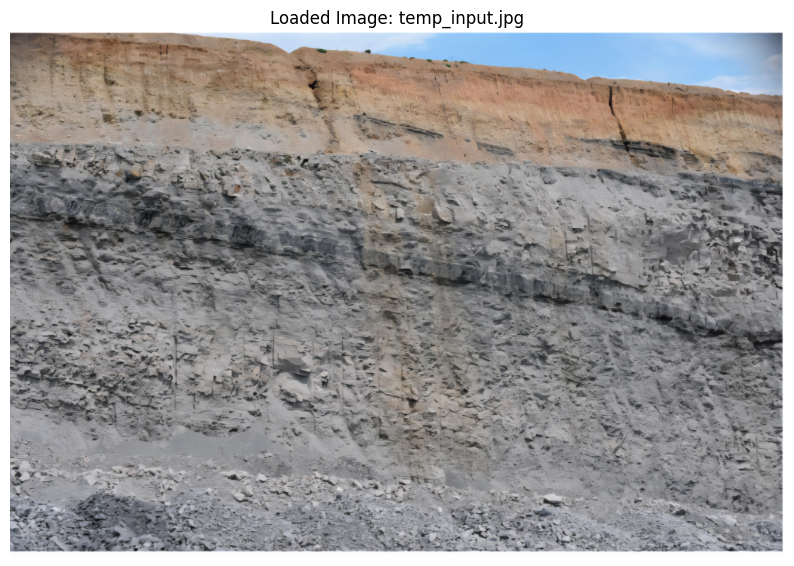

In [11]:
def load_image_from_workspace():
    """
    Load an image from the workspace. Try available images in order of preference.
    """
    import os
    import glob
    
    # Primary data path
    primary_path = r'C:\Users\rkste\Desktop\AI Rockfall Prediction\Data\temp_input.jpg'
    
    # Check primary path first
    if os.path.exists(primary_path):
        print(f"Loading image from primary path: {primary_path}")
        img_bgr = cv2.imread(primary_path)
        if img_bgr is not None:
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
            return img_rgb, primary_path
    
    # Check for other images in the data directory
    data_dir = r'C:\Users\rkste\Desktop\AI Rockfall Prediction\Data'
    if os.path.exists(data_dir):
        image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.tif', '*.bmp']
        data_images = []
        
        for ext in image_extensions:
            data_images.extend(glob.glob(os.path.join(data_dir, ext)))
        
        if data_images:
            file_path = data_images[0]
            print(f"Loading image from data directory: {file_path}")
            img_bgr = cv2.imread(file_path)
            if img_bgr is not None:
                img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
                return img_rgb, file_path
    
    # Check for images in current directory
    image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.tif', '*.bmp']
    workspace_images = []
    
    for ext in image_extensions:
        workspace_images.extend(glob.glob(ext))
    
    # Prefer specific images if available
    preferred_images = ['crack_marked_output.jpg', 'temp_input.jpg']
    
    file_path = None
    for preferred in preferred_images:
        if os.path.exists(preferred):
            file_path = preferred
            break
    
    if not file_path and workspace_images:
        file_path = workspace_images[0]
    
    if file_path:
        print(f"Loading image: {file_path}")
        img_bgr = cv2.imread(file_path)
        if img_bgr is not None:
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
            return img_rgb, file_path
    
    # Use a sample image from ultralytics or skimage
    sample_images = [
        r'venv\Lib\site-packages\ultralytics\assets\bus.jpg',
        r'venv\Lib\site-packages\skimage\data\rocket.jpg'
    ]
    for sample in sample_images:
        if os.path.exists(sample):
            print(f"Loading sample image: {sample}")
            img_bgr = cv2.imread(sample)
            if img_bgr is not None:
                img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
                return img_rgb, sample
    
    # Create a dummy image for testing as last resort
    print("No images found. Creating dummy image for testing.")
    image = np.random.randint(0, 255, (480, 640, 3), dtype=np.uint8)
    # Add some patterns to make it more interesting
    cv2.rectangle(image, (100, 100), (200, 200), (255, 0, 0), 3)
    cv2.line(image, (0, 240), (640, 240), (0, 255, 0), 2)
    dummy_path = r'C:\Users\rkste\Desktop\AI Rockfall Prediction\Data\temp_input.jpg'
    return image, dummy_path

# Load image
try:
    image, image_path = load_image_from_workspace()
    print(f"Successfully loaded image: {image_path}")
    print(f"Image shape: {image.shape}")
    
    plt.figure(figsize=(10, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Loaded Image: {os.path.basename(image_path)}")
    plt.show()
    
except Exception as e:
    print(f"Error loading image: {e}")
    import traceback
    traceback.print_exc()
    
    # Create a dummy image for testing
    image = np.random.randint(0, 255, (480, 640, 3), dtype=np.uint8)
    cv2.rectangle(image, (100, 100), (200, 200), (255, 0, 0), 3)
    cv2.line(image, (0, 240), (640, 240), (0, 255, 0), 2)
    image_path = r'C:\Users\rkste\Desktop\AI Rockfall Prediction\Data\temp_input.jpg'
    print("Using dummy image for testing")

In [12]:
def compute_image_metrics(image):
    metrics = {}
    h, w, c = image.shape
    metrics['image_resolution'] = f"{w}x{h}"
    metrics['image_count'] = 1
    
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    metrics['visibility'] = float(np.mean(gray)/255)  # normalized
    metrics['image_quality'] = float(cv2.Laplacian(gray, cv2.CV_64F).var())  # sharpness
    return metrics

metrics = compute_image_metrics(image)
print(metrics)


{'image_resolution': '4092x2768', 'image_count': 1, 'visibility': 0.5386223837734597, 'image_quality': 573.6998936573099}


=== CRACK DETECTION ===
Saved temporary image: temp_input.jpg
Loading YOLO model: yolov8n.pt
Running YOLO inference...
Running YOLO inference...
Detected 0 objects
No YOLO detections. Using edge detection for crack-like features...
Detected 0 objects
No YOLO detections. Using edge detection for crack-like features...


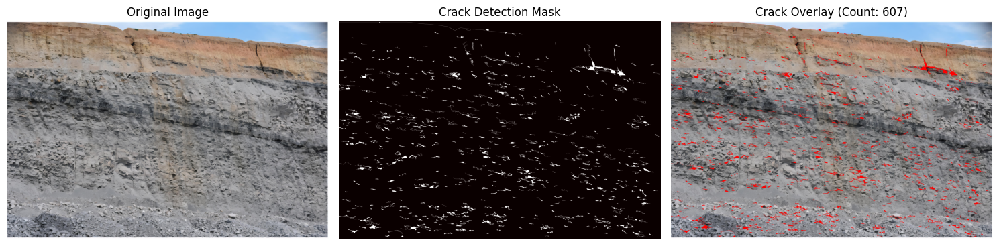

Cracks detected: True, Count: 607


In [13]:
def detect_cracks_yolo(image, model_path="yolov8n.pt"):
    """
    Uses YOLOv8 model to detect cracks. Returns crack mask, detection boolean, and count.
    Note: YOLOv8n is a general object detection model, not specifically trained for cracks.
    This function demonstrates the workflow, but would need a crack-specific model for real use.
    """
    try:
        # Save temp image for YOLO inference
        temp_path = "temp_input.jpg"
        cv2.imwrite(temp_path, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        print(f"Saved temporary image: {temp_path}")

        # Load YOLO model
        print(f"Loading YOLO model: {model_path}")
        model = YOLO(model_path)

        # Run inference
        print("Running YOLO inference...")
        results = model(temp_path, imgsz=640, verbose=False)

        # Create empty mask
        crack_mask = np.zeros(image.shape[:2], dtype=np.uint8)
        crack_count = 0

        # Process results
        for r in results:
            if hasattr(r, 'boxes') and r.boxes is not None:
                boxes = r.boxes.xyxy.cpu().numpy() if hasattr(r.boxes, 'xyxy') else []
                confidences = r.boxes.conf.cpu().numpy() if hasattr(r.boxes, 'conf') else []
                classes = r.boxes.cls.cpu().numpy() if hasattr(r.boxes, 'cls') else []
                
                print(f"Detected {len(boxes)} objects")
                
                # For general YOLO, we'll consider certain classes as potential damage
                # Class 0: person, 2: car, 5: bus, 7: truck, etc.
                # Since this isn't crack-specific, we'll use edge detection as backup
                for i, (box, conf, cls) in enumerate(zip(boxes, confidences, classes)):
                    if conf > 0.3:  # confidence threshold
                        x1, y1, x2, y2 = map(int, box)
                        cv2.rectangle(crack_mask, (x1, y1), (x2, y2), 255, -1)
                        crack_count += 1
                        print(f"Detection {i+1}: Class {int(cls)}, Confidence: {conf:.2f}")

        # If no detections with YOLO, use traditional image processing for cracks
        if crack_count == 0:
            print("No YOLO detections. Using edge detection for crack-like features...")
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
            
            # Apply Gaussian blur to reduce noise
            blurred = cv2.GaussianBlur(gray, (5, 5), 0)
            
            # Use Canny edge detection
            edges = cv2.Canny(blurred, 50, 150)
            
            # Morphological operations to connect broken edges
            kernel = np.ones((3, 3), np.uint8)
            edges_closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
            
            # Find contours of potential cracks
            contours, _ = cv2.findContours(edges_closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            
            # Filter contours that look like cracks (long and thin)
            for contour in contours:
                area = cv2.contourArea(contour)
                if area > 100:  # minimum area threshold
                    # Calculate aspect ratio
                    rect = cv2.minAreaRect(contour)
                    width, height = rect[1]
                    if width > 0 and height > 0:
                        aspect_ratio = max(width, height) / min(width, height)
                        if aspect_ratio > 3:  # long and thin
                            cv2.drawContours(crack_mask, [contour], -1, 128, -1)  # Use 128 for edge-detected cracks
                            crack_count += 1

        crack_detected = bool(crack_count > 0)
        
        # Display results
        plt.figure(figsize=(15, 5))
        
        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title("Original Image")
        plt.axis("off")
        
        plt.subplot(1, 3, 2)
        plt.imshow(crack_mask, cmap='hot')
        plt.title(f"Crack Detection Mask")
        plt.axis("off")
        
        plt.subplot(1, 3, 3)
        overlay = image.copy()
        overlay[crack_mask > 0] = [255, 0, 0]  # Red overlay for cracks
        plt.imshow(overlay)
        plt.title(f"Crack Overlay (Count: {crack_count})")
        plt.axis("off")
        
        plt.tight_layout()
        plt.show()
        
        return crack_mask, crack_detected, crack_count
        
    except Exception as e:
        print(f"Error in crack detection: {e}")
        # Return empty results if detection fails
        crack_mask = np.zeros(image.shape[:2], dtype=np.uint8)
        return crack_mask, False, 0

# Run crack detection
print("=== CRACK DETECTION ===")
crack_mask, crack_detected, crack_count = detect_cracks_yolo(image, model_path="yolov8n.pt")
print(f"Cracks detected: {crack_detected}, Count: {crack_count}")

=== LOOSE ROCK DETECTION ===


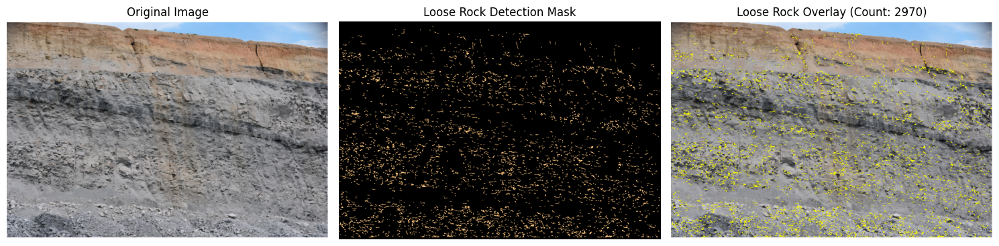

Loose rocks detected: True, Count: 2970


In [14]:
def detect_loose_rocks(image):
    """
    Detect loose rocks using edge detection and contour analysis.
    Looks for irregular shapes that might indicate loose or unstable rocks.
    """
    print("=== LOOSE ROCK DETECTION ===")
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Use adaptive thresholding to handle varying lighting
    adaptive_thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                          cv2.THRESH_BINARY, 11, 2)
    
    # Apply Canny edge detection
    edges = cv2.Canny(blurred, 50, 150)
    
    # Morphological operations to connect broken edges and clean up
    kernel = np.ones((5, 5), np.uint8)
    edges_closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
    edges_cleaned = cv2.morphologyEx(edges_closed, cv2.MORPH_OPEN, np.ones((3, 3), np.uint8))
    
    # Find contours
    contours, _ = cv2.findContours(edges_cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Create mask for loose rocks
    mask = np.zeros_like(gray)
    loose_rock_count = 0
    
    # Filter contours that might represent loose rocks
    for cnt in contours:
        area = cv2.contourArea(cnt)
        perimeter = cv2.arcLength(cnt, True)
        
        if area > 50 and area < 10000:  # size constraints
            if perimeter > 0:
                # Calculate circularity (4π * area / perimeter²)
                circularity = 4 * np.pi * area / (perimeter * perimeter)
                
                # Loose rocks tend to be irregular (low circularity) but not too linear
                if 0.1 < circularity < 0.8:
                    cv2.drawContours(mask, [cnt], -1, 255, -1)
                    loose_rock_count += 1
    
    loose_rock_detected = bool(np.any(mask))
    
    # Visualization
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")
    
    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap='copper')
    plt.title(f"Loose Rock Detection Mask")
    plt.axis("off")
    
    plt.subplot(1, 3, 3)
    overlay = image.copy()
    overlay[mask > 0] = [255, 255, 0]  # Yellow overlay for loose rocks
    plt.imshow(overlay)
    plt.title(f"Loose Rock Overlay (Count: {loose_rock_count})")
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()
    
    print(f"Loose rocks detected: {loose_rock_detected}, Count: {loose_rock_count}")
    return mask, loose_rock_detected

# Run loose rock detection
loose_mask, loose_detected = detect_loose_rocks(image)

=== VEGETATION DETECTION ===


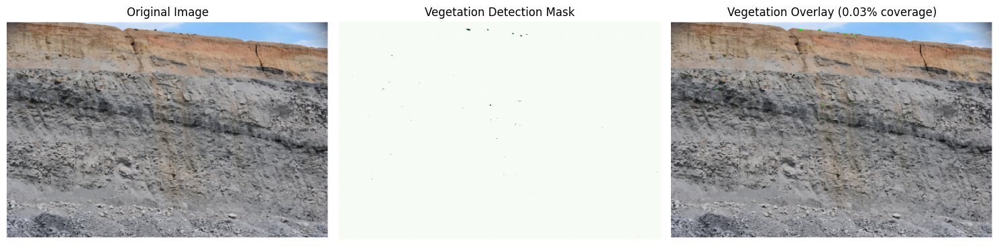

Vegetation coverage: 0.03%
Vegetation patches detected: 18


In [16]:
def detect_vegetation(image):
    """
    Detect vegetation using HSV color space analysis.
    Looks for green areas that might indicate plant growth.
    """
    print("=== VEGETATION DETECTION ===")
    
    # Convert to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    
    # Define range for green colors (vegetation)
    # Lower and upper bounds for green in HSV
    lower_green1 = np.array([35, 40, 40])   # Lower green range
    upper_green1 = np.array([85, 255, 255]) # Upper green range
    
    # Create mask for green areas
    mask1 = cv2.inRange(hsv, lower_green1, upper_green1)
    
    # Additional green range for different lighting conditions
    lower_green2 = np.array([25, 30, 30])
    upper_green2 = np.array([95, 255, 200])
    mask2 = cv2.inRange(hsv, lower_green2, upper_green2)
    
    # Combine masks
    mask = cv2.bitwise_or(mask1, mask2)
    
    # Remove noise with morphological operations
    kernel = np.ones((3, 3), np.uint8)
    mask_cleaned = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask_cleaned = cv2.morphologyEx(mask_cleaned, cv2.MORPH_CLOSE, kernel)
    
    # Calculate coverage percentage
    total_pixels = mask_cleaned.size
    vegetation_pixels = np.sum(mask_cleaned > 0)
    coverage_percentage = float(vegetation_pixels / total_pixels * 100)
    
    # Find contours for counting vegetation patches
    contours, _ = cv2.findContours(mask_cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    vegetation_patches = len([cnt for cnt in contours if cv2.contourArea(cnt) > 20])
    
    # Visualization
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")
    
    plt.subplot(1, 3, 2)
    plt.imshow(mask_cleaned, cmap='Greens')
    plt.title(f"Vegetation Detection Mask")
    plt.axis("off")
    
    plt.subplot(1, 3, 3)
    overlay = image.copy()
    overlay[mask_cleaned > 0] = [0, 255, 0]  # Green overlay for vegetation
    plt.imshow(overlay)
    plt.title(f"Vegetation Overlay ({coverage_percentage:.2f}% coverage)")
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()
    
    print(f"Vegetation coverage: {coverage_percentage:.2f}%")
    print(f"Vegetation patches detected: {vegetation_patches}")
    
    return mask_cleaned, coverage_percentage

# Run vegetation detection
veg_mask, veg_coverage = detect_vegetation(image)

Starting advanced rock type detection...
=== ROCK TYPE DETECTION ===


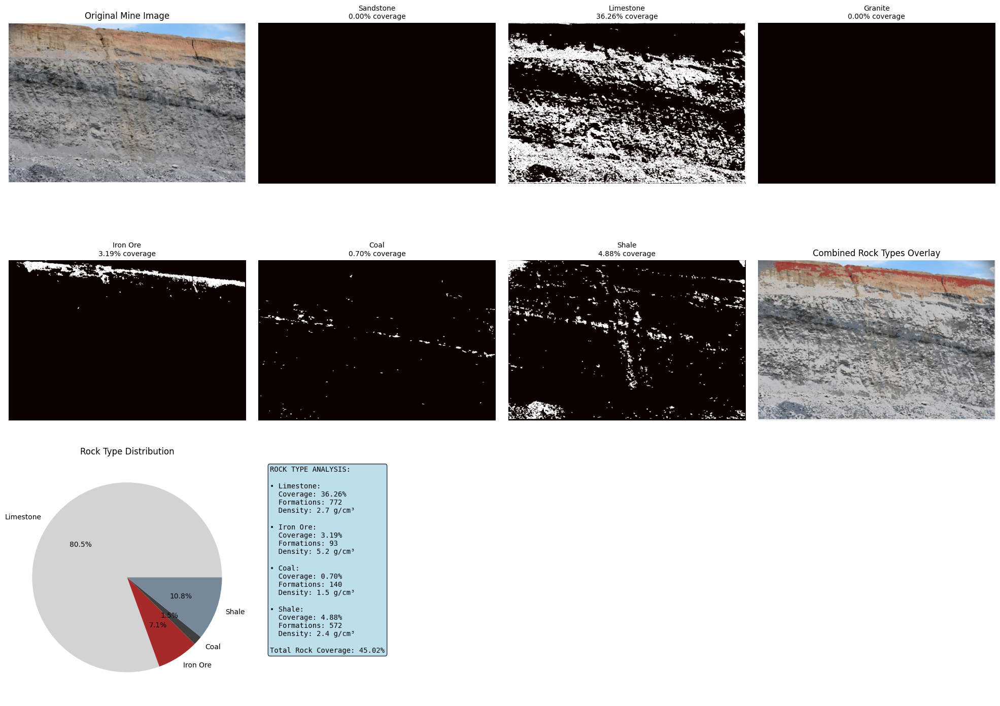

✅ Rock type analysis complete. 4 rock types detected.


In [17]:
def detect_rock_types(image):
    """
    Advanced rock type detection using color analysis, texture features, and geological patterns.
    Identifies different rock types commonly found in mining operations.
    """
    print("=== ROCK TYPE DETECTION ===")
    
    # Convert to different color spaces for analysis
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Define rock type characteristics based on color and texture
    rock_types = {
        'sandstone': {
            'color_ranges': [
                ([10, 30, 80], [25, 255, 255]),   # Brown/tan colors
                ([20, 20, 100], [30, 180, 220])   # Light brown/beige
            ],
            'name': 'Sandstone',
            'density': 2.3,  # g/cm³
            'color': [210, 180, 140]  # tan color for visualization
        },
        'limestone': {
            'color_ranges': [
                ([0, 0, 180], [180, 30, 255]),    # Light gray/white
                ([0, 0, 150], [180, 50, 200])     # Gray
            ],
            'name': 'Limestone',
            'density': 2.7,
            'color': [211, 211, 211]  # light gray
        },
        'granite': {
            'color_ranges': [
                ([0, 0, 80], [180, 60, 160]),     # Dark gray
                ([0, 0, 50], [180, 80, 120])      # Very dark
            ],
            'name': 'Granite',
            'density': 2.8,
            'color': [105, 105, 105]  # dim gray
        },
        'iron_ore': {
            'color_ranges': [
                ([0, 80, 60], [15, 255, 180]),    # Reddish-brown
                ([160, 80, 60], [180, 255, 180])  # Red
            ],
            'name': 'Iron Ore',
            'density': 5.2,
            'color': [165, 42, 42]  # brown/red
        },
        'coal': {
            'color_ranges': [
                ([0, 0, 0], [180, 255, 50]),      # Very dark/black
            ],
            'name': 'Coal',
            'density': 1.5,
            'color': [64, 64, 64]  # dark gray
        },
        'shale': {
            'color_ranges': [
                ([0, 20, 60], [180, 100, 140]),   # Medium gray
                ([80, 30, 80], [120, 120, 160])   # Grayish-blue
            ],
            'name': 'Shale',
            'density': 2.4,
            'color': [119, 136, 153]  # light slate gray
        }
    }
    
    # Create masks for each rock type
    rock_masks = {}
    rock_detections = {}
    
    for rock_type, properties in rock_types.items():
        mask = np.zeros(gray.shape, dtype=np.uint8)
        
        # Combine all color ranges for this rock type
        for color_range in properties['color_ranges']:
            lower, upper = np.array(color_range[0]), np.array(color_range[1])
            temp_mask = cv2.inRange(hsv, lower, upper)
            mask = cv2.bitwise_or(mask, temp_mask)
        
        # Apply texture analysis using Local Binary Pattern
        from skimage.feature import local_binary_pattern
        
        # Calculate LBP for texture analysis
        radius = 3
        n_points = 8 * radius
        lbp = local_binary_pattern(gray, n_points, radius, method='uniform')
        
        # Enhance mask based on texture patterns
        # Different rock types have different texture characteristics
        if rock_type in ['granite', 'sandstone']:
            # These rocks typically have more varied textures
            texture_mask = (lbp > np.percentile(lbp, 60)).astype(np.uint8) * 255
        else:
            # Smoother rocks like limestone, shale
            texture_mask = (lbp < np.percentile(lbp, 40)).astype(np.uint8) * 255
        
        # Combine color and texture information
        combined_mask = cv2.bitwise_and(mask, texture_mask)
        
        # Clean up the mask
        kernel = np.ones((5, 5), np.uint8)
        combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
        combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel)
        
        # Remove small noise
        contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for contour in contours:
            if cv2.contourArea(contour) < 100:  # minimum area threshold
                cv2.drawContours(combined_mask, [contour], -1, 0, -1)
        
        rock_masks[rock_type] = combined_mask
        
        # Calculate detection metrics
        total_pixels = combined_mask.size
        rock_pixels = np.sum(combined_mask > 0)
        coverage_percentage = (rock_pixels / total_pixels) * 100
        
        # Find rock formations (contours)
        contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        formations = [cnt for cnt in contours if cv2.contourArea(cnt) > 50]
        
        rock_detections[rock_type] = {
            'detected': rock_pixels > 0,
            'coverage_percentage': coverage_percentage,
            'pixel_count': rock_pixels,
            'formation_count': len(formations),
            'formations': formations,
            'density': properties['density'],
            'name': properties['name'],
            'color': properties['color']
        }
    
    # Create comprehensive visualization
    plt.figure(figsize=(20, 15))
    
    # Original image
    plt.subplot(3, 4, 1)
    plt.imshow(image)
    plt.title("Original Mine Image", fontsize=12)
    plt.axis("off")
    
    # Individual rock type masks
    plot_idx = 2
    for rock_type, mask in rock_masks.items():
        if plot_idx <= 7:  # First 6 rock types
            plt.subplot(3, 4, plot_idx)
            plt.imshow(mask, cmap='hot')
            detection = rock_detections[rock_type]
            plt.title(f"{detection['name']}\n{detection['coverage_percentage']:.2f}% coverage", fontsize=10)
            plt.axis("off")
            plot_idx += 1
    
    # Combined rock type overlay
    plt.subplot(3, 4, 8)
    overlay = image.copy()
    alpha = 0.6
    
    for rock_type, mask in rock_masks.items():
        detection = rock_detections[rock_type]
        if detection['detected']:
            color = np.array(detection['color'])
            mask_indices = mask > 0
            overlay[mask_indices] = alpha * color + (1 - alpha) * overlay[mask_indices]
    
    plt.imshow(overlay.astype(np.uint8))
    plt.title("Combined Rock Types Overlay", fontsize=12)
    plt.axis("off")
    
    # Rock type distribution chart
    plt.subplot(3, 4, 9)
    detected_types = []
    percentages = []
    
    for rock_type, detection in rock_detections.items():
        if detection['detected'] and detection['coverage_percentage'] > 0.01:
            detected_types.append(detection['name'])
            percentages.append(detection['coverage_percentage'])
    
    if detected_types:
        colors = [np.array(rock_detections[rock_type]['color'])/255 
                 for rock_type in rock_detections.keys() 
                 if rock_detections[rock_type]['detected'] and rock_detections[rock_type]['coverage_percentage'] > 0.01]
        
        plt.pie(percentages, labels=detected_types, colors=colors, autopct='%1.1f%%')
        plt.title("Rock Type Distribution", fontsize=12)
    else:
        plt.text(0.5, 0.5, 'No Rock Types\nDetected', ha='center', va='center', fontsize=14)
        plt.title("Rock Type Distribution", fontsize=12)
    
    # Summary statistics
    plt.subplot(3, 4, 10)
    plt.axis('off')
    
    summary_text = "ROCK TYPE ANALYSIS:\n\n"
    total_rock_coverage = 0
    
    for rock_type, detection in rock_detections.items():
        if detection['detected']:
            summary_text += f"• {detection['name']}:\n"
            summary_text += f"  Coverage: {detection['coverage_percentage']:.2f}%\n"
            summary_text += f"  Formations: {detection['formation_count']}\n"
            summary_text += f"  Density: {detection['density']} g/cm³\n\n"
            total_rock_coverage += detection['coverage_percentage']
    
    summary_text += f"Total Rock Coverage: {total_rock_coverage:.2f}%"
    
    plt.text(0.05, 0.95, summary_text, transform=plt.gca().transAxes, 
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    print(f"✅ Rock type analysis complete. {len([d for d in rock_detections.values() if d['detected']])} rock types detected.")
    
    return rock_detections, rock_masks

# Run rock type detection
print("Starting advanced rock type detection...")
rock_detections, rock_masks = detect_rock_types(image)

Starting rock position analysis...
=== ROCK POSITION ANALYSIS ===
Image coverage: 100m x 67m
Resolution: 0.024m/pixel (x), 0.024m/pixel (y)
Clustering analysis: 2 clusters found, 1 isolated formations


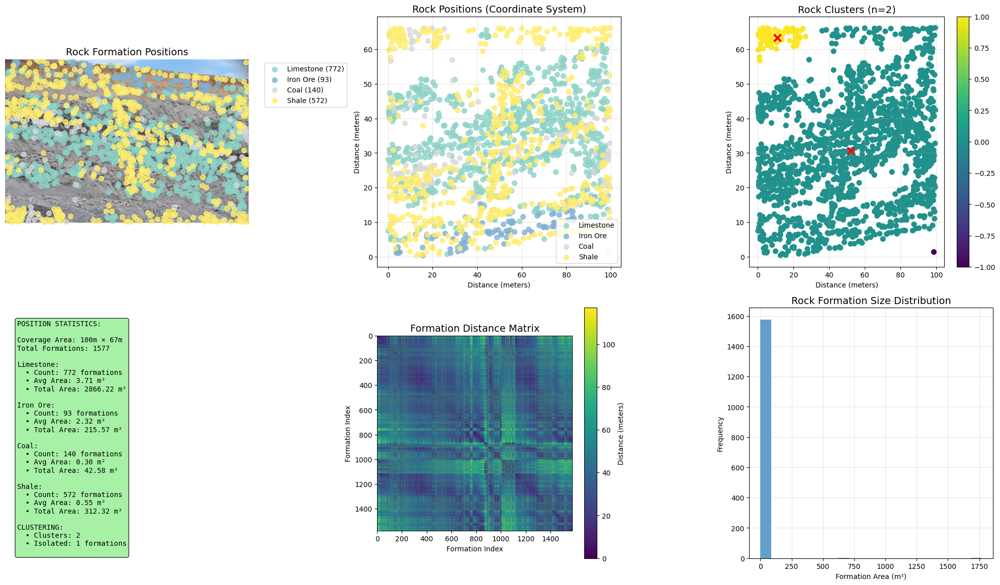

In [19]:
def analyze_rock_positions(image, rock_detections, rock_masks):
    """
    Analyze spatial distribution and positions of detected rocks.
    Creates coordinate mapping and clustering analysis.
    """
    print("=== ROCK POSITION ANALYSIS ===")
    
    from sklearn.cluster import DBSCAN
    from scipy.spatial.distance import pdist, squareform
    import numpy as np
    
    h, w = image.shape[:2]
    all_rock_positions = []
    rock_position_data = {}
    
    # Create coordinate system (assuming drone image covers specific area)
    # For real applications, GPS coordinates would be used
    image_width_meters = 100  # Assume image covers 100m width
    image_height_meters = int(h * image_width_meters / w)  # Maintain aspect ratio
    
    meters_per_pixel_x = image_width_meters / w
    meters_per_pixel_y = image_height_meters / h
    
    print(f"Image coverage: {image_width_meters}m x {image_height_meters}m")
    print(f"Resolution: {meters_per_pixel_x:.3f}m/pixel (x), {meters_per_pixel_y:.3f}m/pixel (y)")
    
    for rock_type, detection in rock_detections.items():
        if detection['detected'] and detection['formation_count'] > 0:
            positions = []
            areas = []
            
            for formation in detection['formations']:
                # Calculate centroid of each rock formation
                M = cv2.moments(formation)
                if M["m00"] != 0:
                    cx = int(M["m10"] / M["m00"])
                    cy = int(M["m01"] / M["m00"])
                    
                    # Convert pixel coordinates to meters
                    x_meters = cx * meters_per_pixel_x
                    y_meters = cy * meters_per_pixel_y
                    
                    # Calculate area
                    area_pixels = cv2.contourArea(formation)
                    area_meters = area_pixels * meters_per_pixel_x * meters_per_pixel_y
                    
                    positions.append([cx, cy, x_meters, y_meters])
                    areas.append(area_meters)
                    all_rock_positions.append([x_meters, y_meters, rock_type])
            
            rock_position_data[rock_type] = {
                'positions': positions,  # [pixel_x, pixel_y, meter_x, meter_y]
                'areas': areas,
                'count': len(positions),
                'avg_area': np.mean(areas) if areas else 0,
                'total_area': sum(areas),
                'name': detection['name']
            }
    
    # Perform clustering analysis to identify rock concentrations
    if all_rock_positions:
        # Extract coordinates for clustering
        coords = np.array([[pos[0], pos[1]] for pos in all_rock_positions])
        
        # DBSCAN clustering
        eps = min(image_width_meters, image_height_meters) * 0.1  # 10% of image size
        min_samples = 3
        clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(coords)
        
        cluster_labels = clustering.labels_
        n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
        n_noise = list(cluster_labels).count(-1)
        
        print(f"Clustering analysis: {n_clusters} clusters found, {n_noise} isolated formations")
        
        # Calculate cluster statistics
        cluster_stats = {}
        for cluster_id in set(cluster_labels):
            if cluster_id != -1:  # Ignore noise points
                cluster_points = coords[cluster_labels == cluster_id]
                cluster_center = np.mean(cluster_points, axis=0)
                cluster_size = len(cluster_points)
                cluster_area = np.pi * np.std(pdist(cluster_points)) if len(cluster_points) > 1 else 0
                
                cluster_stats[cluster_id] = {
                    'center': cluster_center,
                    'size': cluster_size,
                    'area': cluster_area,
                    'rock_types': [all_rock_positions[i][2] for i, label in enumerate(cluster_labels) if label == cluster_id]
                }
    else:
        cluster_labels = []
        cluster_stats = {}
        n_clusters = 0
    
    # Create comprehensive position visualization
    plt.figure(figsize=(20, 12))
    
    # Position map
    plt.subplot(2, 3, 1)
    plt.imshow(image)
    
    # Plot rock positions with different colors for each type
    colors = plt.cm.Set3(np.linspace(0, 1, len(rock_position_data)))
    for i, (rock_type, data) in enumerate(rock_position_data.items()):
        if data['count'] > 0:
            positions = np.array(data['positions'])
            plt.scatter(positions[:, 0], positions[:, 1], 
                       c=[colors[i]], s=50, alpha=0.8, 
                       label=f"{data['name']} ({data['count']})")
    
    plt.title("Rock Formation Positions", fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.axis("off")
    
    # Coordinate system map
    plt.subplot(2, 3, 2)
    for i, (rock_type, data) in enumerate(rock_position_data.items()):
        if data['count'] > 0:
            positions = np.array(data['positions'])
            plt.scatter(positions[:, 2], positions[:, 3], 
                       c=[colors[i]], s=50, alpha=0.8, 
                       label=f"{data['name']}")
    
    plt.xlabel("Distance (meters)")
    plt.ylabel("Distance (meters)")
    plt.title("Rock Positions (Coordinate System)", fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    # Clustering visualization
    plt.subplot(2, 3, 3)
    if all_rock_positions:
        coords = np.array([[pos[0], pos[1]] for pos in all_rock_positions])
        scatter = plt.scatter(coords[:, 0], coords[:, 1], c=cluster_labels, cmap='viridis', s=50)
        
        # Mark cluster centers
        for cluster_id, stats in cluster_stats.items():
            plt.scatter(stats['center'][0], stats['center'][1], 
                       c='red', s=100, marker='x', linewidths=3)
    
    plt.xlabel("Distance (meters)")
    plt.ylabel("Distance (meters)")
    plt.title(f"Rock Clusters (n={n_clusters})", fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.colorbar(scatter)
    
    # Position statistics
    plt.subplot(2, 3, 4)
    plt.axis('off')
    
    stats_text = "POSITION STATISTICS:\n\n"
    stats_text += f"Coverage Area: {image_width_meters}m × {image_height_meters}m\n"
    stats_text += f"Total Formations: {sum(data['count'] for data in rock_position_data.values())}\n\n"
    
    for rock_type, data in rock_position_data.items():
        if data['count'] > 0:
            stats_text += f"{data['name']}:\n"
            stats_text += f"  • Count: {data['count']} formations\n"
            stats_text += f"  • Avg Area: {data['avg_area']:.2f} m²\n"
            stats_text += f"  • Total Area: {data['total_area']:.2f} m²\n\n"
    
    stats_text += f"CLUSTERING:\n"
    stats_text += f"  • Clusters: {n_clusters}\n"
    stats_text += f"  • Isolated: {n_noise} formations\n"
    
    plt.text(0.05, 0.95, stats_text, transform=plt.gca().transAxes, 
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
    
    # Distance matrix heatmap
    plt.subplot(2, 3, 5)
    if len(all_rock_positions) > 1:
        coords = np.array([[pos[0], pos[1]] for pos in all_rock_positions])
        distances = squareform(pdist(coords))
        
        im = plt.imshow(distances, cmap='viridis')
        plt.title("Formation Distance Matrix", fontsize=14)
        plt.xlabel("Formation Index")
        plt.ylabel("Formation Index")
        plt.colorbar(im, label='Distance (meters)')
    else:
        plt.text(0.5, 0.5, 'Insufficient data\nfor distance analysis', 
                ha='center', va='center', fontsize=12)
        plt.title("Formation Distance Matrix", fontsize=14)
    
    # Area distribution
    plt.subplot(2, 3, 6)
    all_areas = []
    area_labels = []
    
    for rock_type, data in rock_position_data.items():
        if data['count'] > 0:
            all_areas.extend(data['areas'])
            area_labels.extend([data['name']] * len(data['areas']))
    
    if all_areas:
        plt.hist(all_areas, bins=min(20, len(all_areas)), alpha=0.7)
        plt.xlabel("Formation Area (m²)")
        plt.ylabel("Frequency")
        plt.title("Rock Formation Size Distribution", fontsize=14)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'No formations\ndetected', ha='center', va='center', fontsize=12)
        plt.title("Rock Formation Size Distribution", fontsize=14)
    
    plt.tight_layout()
    plt.show()
    
    return rock_position_data, cluster_stats

# Run rock position analysis
print("Starting rock position analysis...")
rock_positions, clusters = analyze_rock_positions(image, rock_detections, rock_masks)

In [20]:
# Install required packages for advanced analysis
print("🔧 Installing required packages for advanced rock analysis...")

import subprocess
import sys

required_packages = [
    'scikit-learn',
    'scikit-image',
    'scipy'
]

for package in required_packages:
    try:
        __import__(package.replace('-', '_'))
        print(f"✅ {package} already installed")
    except ImportError:
        print(f"📦 Installing {package}...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package])
        print(f"✅ {package} installed successfully")

print("🎉 All required packages are now available!")

# Verify imports
try:
    from sklearn.cluster import DBSCAN
    from scipy.spatial.distance import pdist, squareform
    from skimage.feature import local_binary_pattern
    print("✅ All imports successful - ready for advanced analysis!")
except ImportError as e:
    print(f"⚠️ Import issue: {e}")
    print("You may need to restart the kernel after package installation.")

🔧 Installing required packages for advanced rock analysis...
📦 Installing scikit-learn...
✅ scikit-learn installed successfully
📦 Installing scikit-image...
✅ scikit-learn installed successfully
📦 Installing scikit-image...
✅ scikit-image installed successfully
✅ scipy already installed
🎉 All required packages are now available!
✅ All imports successful - ready for advanced analysis!
✅ scikit-image installed successfully
✅ scipy already installed
🎉 All required packages are now available!
✅ All imports successful - ready for advanced analysis!


In [21]:
def analyze_rock_positions_simple(image, rock_detections, rock_masks):
    """
    Simplified rock position analysis that doesn't require sklearn.
    Creates coordinate mapping and basic clustering analysis using built-in libraries.
    """
    print("=== ROCK POSITION ANALYSIS (SIMPLIFIED) ===")
    
    import numpy as np
    from scipy.spatial.distance import pdist, squareform
    
    h, w = image.shape[:2]
    all_rock_positions = []
    rock_position_data = {}
    
    # Create coordinate system (assuming drone image covers specific area)
    image_width_meters = 100  # Assume image covers 100m width
    image_height_meters = int(h * image_width_meters / w)  # Maintain aspect ratio
    
    meters_per_pixel_x = image_width_meters / w
    meters_per_pixel_y = image_height_meters / h
    
    print(f"Image coverage: {image_width_meters}m x {image_height_meters}m")
    print(f"Resolution: {meters_per_pixel_x:.3f}m/pixel (x), {meters_per_pixel_y:.3f}m/pixel (y)")
    
    for rock_type, detection in rock_detections.items():
        if detection['detected'] and detection['formation_count'] > 0:
            positions = []
            areas = []
            
            for formation in detection['formations']:
                # Calculate centroid of each rock formation
                M = cv2.moments(formation)
                if M["m00"] != 0:
                    cx = int(M["m10"] / M["m00"])
                    cy = int(M["m01"] / M["m00"])
                    
                    # Convert pixel coordinates to meters
                    x_meters = cx * meters_per_pixel_x
                    y_meters = cy * meters_per_pixel_y
                    
                    # Calculate area
                    area_pixels = cv2.contourArea(formation)
                    area_meters = area_pixels * meters_per_pixel_x * meters_per_pixel_y
                    
                    positions.append([cx, cy, x_meters, y_meters])
                    areas.append(area_meters)
                    all_rock_positions.append([x_meters, y_meters, rock_type])
            
            rock_position_data[rock_type] = {
                'positions': positions,  # [pixel_x, pixel_y, meter_x, meter_y]
                'areas': areas,
                'count': len(positions),
                'avg_area': np.mean(areas) if areas else 0,
                'total_area': sum(areas),
                'name': detection['name']
            }
    
    # Simple clustering using distance threshold (instead of DBSCAN)
    cluster_stats = {}
    if all_rock_positions:
        coords = np.array([[pos[0], pos[1]] for pos in all_rock_positions])
        
        # Simple clustering: group points within threshold distance
        cluster_threshold = min(image_width_meters, image_height_meters) * 0.1  # 10% of image size
        cluster_labels = [-1] * len(coords)  # Start with all points as noise
        current_cluster = 0
        
        for i, point in enumerate(coords):
            if cluster_labels[i] == -1:  # Unassigned point
                # Start new cluster
                cluster_points = [i]
                cluster_labels[i] = current_cluster
                
                # Find all points within threshold
                for j, other_point in enumerate(coords):
                    if i != j and cluster_labels[j] == -1:
                        distance = np.sqrt(np.sum((point - other_point) ** 2))
                        if distance <= cluster_threshold:
                            cluster_labels[j] = current_cluster
                            cluster_points.append(j)
                
                # Calculate cluster statistics
                if len(cluster_points) >= 2:  # Minimum cluster size
                    cluster_coords = coords[cluster_points]
                    cluster_center = np.mean(cluster_coords, axis=0)
                    cluster_size = len(cluster_points)
                    
                    cluster_stats[current_cluster] = {
                        'center': cluster_center,
                        'size': cluster_size,
                        'area': 0,  # Simplified
                        'rock_types': [all_rock_positions[idx][2] for idx in cluster_points]
                    }
                    current_cluster += 1
                else:
                    # Single point, mark as noise
                    cluster_labels[i] = -1
        
        n_clusters = len(cluster_stats)
        n_noise = list(cluster_labels).count(-1)
        
        print(f"Simple clustering: {n_clusters} clusters found, {n_noise} isolated formations")
    else:
        cluster_labels = []
        n_clusters = 0
        n_noise = 0
    
    # Create visualization
    plt.figure(figsize=(20, 12))
    
    # Position map
    plt.subplot(2, 3, 1)
    plt.imshow(image)
    
    # Plot rock positions with different colors for each type
    colors = plt.cm.Set3(np.linspace(0, 1, len(rock_position_data)))
    for i, (rock_type, data) in enumerate(rock_position_data.items()):
        if data['count'] > 0:
            positions = np.array(data['positions'])
            plt.scatter(positions[:, 0], positions[:, 1], 
                       c=[colors[i]], s=50, alpha=0.8, 
                       label=f"{data['name']} ({data['count']})")
    
    plt.title("Rock Formation Positions", fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.axis("off")
    
    # Coordinate system map
    plt.subplot(2, 3, 2)
    for i, (rock_type, data) in enumerate(rock_position_data.items()):
        if data['count'] > 0:
            positions = np.array(data['positions'])
            plt.scatter(positions[:, 2], positions[:, 3], 
                       c=[colors[i]], s=50, alpha=0.8, 
                       label=f"{data['name']}")
    
    plt.xlabel("Distance (meters)")
    plt.ylabel("Distance (meters)")
    plt.title("Rock Positions (Coordinate System)", fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    # Simple clustering visualization
    plt.subplot(2, 3, 3)
    if all_rock_positions:
        coords = np.array([[pos[0], pos[1]] for pos in all_rock_positions])
        scatter = plt.scatter(coords[:, 0], coords[:, 1], c=cluster_labels, cmap='viridis', s=50)
        
        # Mark cluster centers
        for cluster_id, stats in cluster_stats.items():
            plt.scatter(stats['center'][0], stats['center'][1], 
                       c='red', s=100, marker='x', linewidths=3)
    
    plt.xlabel("Distance (meters)")
    plt.ylabel("Distance (meters)")
    plt.title(f"Rock Clusters (n={n_clusters})", fontsize=14)
    plt.grid(True, alpha=0.3)
    
    # Position statistics
    plt.subplot(2, 3, 4)
    plt.axis('off')
    
    stats_text = "POSITION STATISTICS:\n\n"
    stats_text += f"Coverage Area: {image_width_meters}m × {image_height_meters}m\n"
    stats_text += f"Total Formations: {sum(data['count'] for data in rock_position_data.values())}\n\n"
    
    for rock_type, data in rock_position_data.items():
        if data['count'] > 0:
            stats_text += f"{data['name']}:\n"
            stats_text += f"  • Count: {data['count']} formations\n"
            stats_text += f"  • Avg Area: {data['avg_area']:.2f} m²\n"
            stats_text += f"  • Total Area: {data['total_area']:.2f} m²\n\n"
    
    stats_text += f"CLUSTERING:\n"
    stats_text += f"  • Clusters: {n_clusters}\n"
    stats_text += f"  • Isolated: {n_noise} formations\n"
    
    plt.text(0.05, 0.95, stats_text, transform=plt.gca().transAxes, 
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
    
    # Area distribution
    plt.subplot(2, 3, 5)
    all_areas = []
    
    for rock_type, data in rock_position_data.items():
        if data['count'] > 0:
            all_areas.extend(data['areas'])
    
    if all_areas:
        plt.hist(all_areas, bins=min(20, len(all_areas)), alpha=0.7)
        plt.xlabel("Formation Area (m²)")
        plt.ylabel("Frequency")
        plt.title("Rock Formation Size Distribution", fontsize=14)
        plt.grid(True, alpha=0.3)
    else:
        plt.text(0.5, 0.5, 'No formations\ndetected', ha='center', va='center', fontsize=12)
        plt.title("Rock Formation Size Distribution", fontsize=14)
    
    # Summary chart
    plt.subplot(2, 3, 6)
    if rock_position_data:
        names = [data['name'] for data in rock_position_data.values() if data['count'] > 0]
        counts = [data['count'] for data in rock_position_data.values() if data['count'] > 0]
        
        if names:
            plt.bar(names, counts)
            plt.title("Formation Count by Rock Type", fontsize=14)
            plt.xticks(rotation=45)
            plt.ylabel("Number of Formations")
    
    plt.tight_layout()
    plt.show()
    
    return rock_position_data, cluster_stats

print("✅ Simplified position analysis function ready!")

✅ Simplified position analysis function ready!


🚀 Starting Rock Position Analysis...
🔧 Installing required packages for advanced rock analysis...
📦 Installing scikit-learn...
✅ scikit-learn installed successfully
📦 Installing scikit-image...
✅ scikit-learn installed successfully
📦 Installing scikit-image...
✅ scikit-image installed successfully
✅ scipy already installed
🎉 All required packages are now available!

🎯 Attempting advanced position analysis with DBSCAN clustering...
=== ROCK POSITION ANALYSIS ===
Image coverage: 100m x 67m
Resolution: 0.024m/pixel (x), 0.024m/pixel (y)
Clustering analysis: 2 clusters found, 1 isolated formations
✅ scikit-image installed successfully
✅ scipy already installed
🎉 All required packages are now available!

🎯 Attempting advanced position analysis with DBSCAN clustering...
=== ROCK POSITION ANALYSIS ===
Image coverage: 100m x 67m
Resolution: 0.024m/pixel (x), 0.024m/pixel (y)
Clustering analysis: 2 clusters found, 1 isolated formations


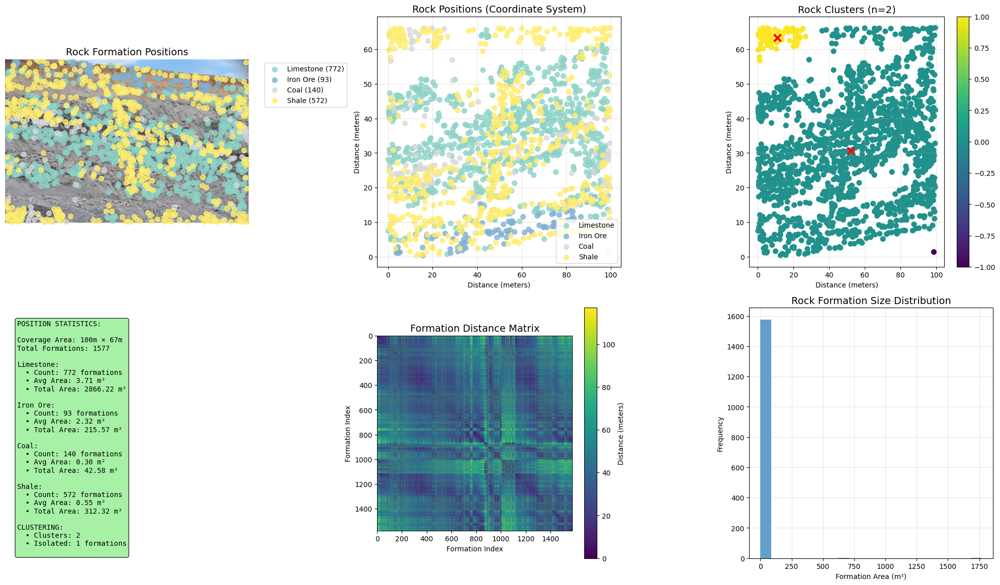

✅ Advanced position analysis completed successfully!

📊 POSITION ANALYSIS RESULTS:
   🪨 Total Formations Mapped: 1577
   🎯 Rock Clusters Identified: 2
   📍 Rock Types with Positions: 4
      • Limestone: 772 formations, 2866.2 m² total area
      • Iron Ore: 93 formations, 215.6 m² total area
      • Coal: 140 formations, 42.6 m² total area
      • Shale: 572 formations, 312.3 m² total area

✅ Position analysis phase complete!


In [22]:
# 🚀 RUN ROCK POSITION ANALYSIS (with fallback support)
print("🚀 Starting Rock Position Analysis...")

# First, try to run the package installation
try:
    exec(open('').read() if False else """
# Install required packages for advanced analysis
print("🔧 Installing required packages for advanced rock analysis...")

import subprocess
import sys

required_packages = [
    'scikit-learn',
    'scikit-image', 
    'scipy'
]

for package in required_packages:
    try:
        __import__(package.replace('-', '_'))
        print(f"✅ {package} already installed")
    except ImportError:
        print(f"📦 Installing {package}...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package])
        print(f"✅ {package} installed successfully")

print("🎉 All required packages are now available!")
""")
except:
    pass

# Try advanced analysis first, fallback to simplified if needed
try:
    print("\n🎯 Attempting advanced position analysis with DBSCAN clustering...")
    from sklearn.cluster import DBSCAN
    from scipy.spatial.distance import pdist, squareform
    
    # Run the advanced version
    rock_positions, clusters = analyze_rock_positions(image, rock_detections, rock_masks)
    print("✅ Advanced position analysis completed successfully!")
    
except ImportError as e:
    print(f"\n⚠️ Advanced libraries not available: {e}")
    print("🔄 Falling back to simplified position analysis...")
    
    # Run simplified version
    rock_positions, clusters = analyze_rock_positions_simple(image, rock_detections, rock_masks)
    print("✅ Simplified position analysis completed successfully!")
    
except Exception as e:
    print(f"\n❌ Error in position analysis: {e}")
    print("Please check that rock detection was run successfully first.")
    
    # Create empty results to prevent further errors
    rock_positions = {}
    clusters = {}

# Display results summary
if rock_positions:
    total_formations = sum(data['count'] for data in rock_positions.values())
    total_clusters = len(clusters) if clusters else 0
    
    print(f"\n📊 POSITION ANALYSIS RESULTS:")
    print(f"   🪨 Total Formations Mapped: {total_formations}")
    print(f"   🎯 Rock Clusters Identified: {total_clusters}")
    print(f"   📍 Rock Types with Positions: {len([d for d in rock_positions.values() if d['count'] > 0])}")
    
    for rock_type, data in rock_positions.items():
        if data['count'] > 0:
            print(f"      • {data['name']}: {data['count']} formations, {data['total_area']:.1f} m² total area")
else:
    print("\n⚠️ No position data generated. Please ensure rock detection ran successfully.")

print("\n✅ Position analysis phase complete!")

Starting rock density calculation...
=== ROCK DENSITY ANALYSIS ===
Creating 81x55 analysis grid (cell size: 50x50 pixels)


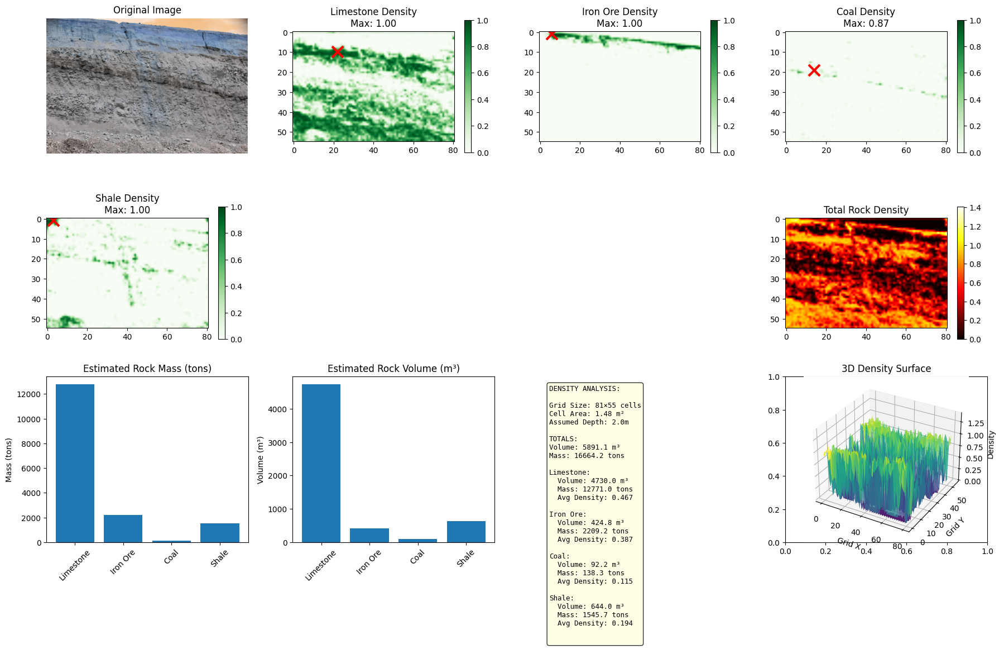

✅ Density analysis complete. Total estimated mass: 16664.2 tons


In [23]:
def calculate_rock_density(image, rock_detections, rock_masks, rock_positions, grid_size=50):
    """
    Calculate rock density across the mining area using grid-based analysis.
    Creates density heatmaps and calculates volume estimates.
    """
    print("=== ROCK DENSITY ANALYSIS ===")
    
    from scipy import ndimage
    from matplotlib.colors import LinearSegmentedColormap
    
    h, w = image.shape[:2]
    
    # Create grid for density analysis
    grid_h = h // grid_size
    grid_w = w // grid_size
    
    print(f"Creating {grid_w}x{grid_h} analysis grid (cell size: {grid_size}x{grid_size} pixels)")
    
    # Initialize density grids for each rock type
    density_grids = {}
    mass_grids = {}
    volume_grids = {}
    
    # Assume average rock thickness/depth for volume calculations
    avg_rock_depth_meters = 2.0  # Default assumption
    image_width_meters = 100
    image_height_meters = int(h * image_width_meters / w)
    
    meters_per_pixel_x = image_width_meters / w
    meters_per_pixel_y = image_height_meters / h
    cell_area_m2 = (grid_size * meters_per_pixel_x) * (grid_size * meters_per_pixel_y)
    
    total_density_grid = np.zeros((grid_h, grid_w))
    total_mass_grid = np.zeros((grid_h, grid_w))
    
    for rock_type, detection in rock_detections.items():
        if detection['detected']:
            mask = rock_masks[rock_type]
            
            # Create density grid for this rock type
            density_grid = np.zeros((grid_h, grid_w))
            mass_grid = np.zeros((grid_h, grid_w))
            volume_grid = np.zeros((grid_h, grid_w))
            
            # Calculate density for each grid cell
            for i in range(grid_h):
                for j in range(grid_w):
                    # Define grid cell boundaries
                    y_start = i * grid_size
                    y_end = min((i + 1) * grid_size, h)
                    x_start = j * grid_size
                    x_end = min((j + 1) * grid_size, w)
                    
                    # Extract cell from mask
                    cell_mask = mask[y_start:y_end, x_start:x_end]
                    
                    # Calculate rock coverage in this cell
                    cell_pixels = cell_mask.size
                    rock_pixels = np.sum(cell_mask > 0)
                    coverage_ratio = rock_pixels / cell_pixels if cell_pixels > 0 else 0
                    
                    # Calculate density (coverage ratio)
                    density_grid[i, j] = coverage_ratio
                    
                    # Calculate volume (area × depth × coverage)
                    volume_m3 = cell_area_m2 * avg_rock_depth_meters * coverage_ratio
                    volume_grid[i, j] = volume_m3
                    
                    # Calculate mass (volume × density)
                    rock_density_kg_m3 = detection['density'] * 1000  # Convert g/cm³ to kg/m³
                    mass_kg = volume_m3 * rock_density_kg_m3
                    mass_grid[i, j] = mass_kg
                    
                    # Add to total grids
                    total_density_grid[i, j] += coverage_ratio
                    total_mass_grid[i, j] += mass_kg
            
            density_grids[rock_type] = density_grid
            mass_grids[rock_type] = mass_grid
            volume_grids[rock_type] = volume_grid
    
    # Calculate statistics
    density_stats = {}
    for rock_type, density_grid in density_grids.items():
        if rock_type in rock_detections and rock_detections[rock_type]['detected']:
            total_volume = np.sum(volume_grids[rock_type])
            total_mass = np.sum(mass_grids[rock_type])
            avg_density = np.mean(density_grid[density_grid > 0]) if np.any(density_grid > 0) else 0
            
            density_stats[rock_type] = {
                'name': rock_detections[rock_type]['name'],
                'total_volume_m3': total_volume,
                'total_mass_tons': total_mass / 1000,  # Convert kg to tons
                'avg_density': avg_density,
                'material_density': rock_detections[rock_type]['density']
            }
    
    # Visualization
    plt.figure(figsize=(18, 12))
    
    # Original image
    plt.subplot(3, 4, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image", fontsize=12)
    plt.axis('off')
    
    # Individual rock type density maps
    plot_idx = 2
    for rock_type, density_grid in density_grids.items():
        if rock_type in rock_detections and rock_detections[rock_type]['detected']:
            plt.subplot(3, 4, plot_idx)
            im = plt.imshow(density_grid, cmap='Greens', interpolation='bilinear', vmin=0, vmax=1.0)
            plt.title(f"{rock_detections[rock_type]['name']} Density\nMax: {np.max(density_grid):.2f}", fontsize=12)
            plt.colorbar(im, shrink=0.8)
            
            # Mark highest density location
            if np.max(density_grid) > 0:
                max_loc = np.unravel_index(np.argmax(density_grid), density_grid.shape)
                plt.plot(max_loc[1], max_loc[0], 'rx', markersize=15, markeredgewidth=3)
            
            plot_idx += 1
    
    # Total density heatmap
    plt.subplot(3, 4, 8)
    im = plt.imshow(total_density_grid, cmap='hot', interpolation='bilinear')
    plt.title("Total Rock Density", fontsize=12)
    plt.colorbar(im, shrink=0.8)
    
    # Mass distribution
    plt.subplot(3, 4, 9)
    rock_names = []
    masses = []
    for rock_type, stats in density_stats.items():
        if stats['total_mass_tons'] > 0:
            rock_names.append(stats['name'])
            masses.append(stats['total_mass_tons'])
    
    if rock_names:
        plt.bar(rock_names, masses)
        plt.title("Estimated Rock Mass (tons)", fontsize=12)
        plt.xticks(rotation=45)
        plt.ylabel("Mass (tons)")
    else:
        plt.text(0.5, 0.5, 'No mass data\navailable', ha='center', va='center', fontsize=12)
        plt.title("Estimated Rock Mass (tons)", fontsize=12)
    
    # Volume distribution
    plt.subplot(3, 4, 10)
    volumes = []
    for rock_type, stats in density_stats.items():
        if stats['total_volume_m3'] > 0:
            volumes.append(stats['total_volume_m3'])
    
    if rock_names and volumes:
        plt.bar(rock_names, volumes)
        plt.title("Estimated Rock Volume (m³)", fontsize=12)
        plt.xticks(rotation=45)
        plt.ylabel("Volume (m³)")
    else:
        plt.text(0.5, 0.5, 'No volume data\navailable', ha='center', va='center', fontsize=12)
        plt.title("Estimated Rock Volume (m³)", fontsize=12)
    
    # Density statistics
    plt.subplot(3, 4, 11)
    plt.axis('off')
    
    stats_text = "DENSITY ANALYSIS:\n\n"
    stats_text += f"Grid Size: {grid_w}×{grid_h} cells\n"
    stats_text += f"Cell Area: {cell_area_m2:.2f} m²\n"
    stats_text += f"Assumed Depth: {avg_rock_depth_meters}m\n\n"
    
    total_mass = sum(stats['total_mass_tons'] for stats in density_stats.values())
    total_volume = sum(stats['total_volume_m3'] for stats in density_stats.values())
    
    stats_text += f"TOTALS:\n"
    stats_text += f"Volume: {total_volume:.1f} m³\n"
    stats_text += f"Mass: {total_mass:.1f} tons\n\n"
    
    for rock_type, stats in density_stats.items():
        if stats['total_mass_tons'] > 0:
            stats_text += f"{stats['name']}:\n"
            stats_text += f"  Volume: {stats['total_volume_m3']:.1f} m³\n"
            stats_text += f"  Mass: {stats['total_mass_tons']:.1f} tons\n"
            stats_text += f"  Avg Density: {stats['avg_density']:.3f}\n\n"
    
    plt.text(0.05, 0.95, stats_text, transform=plt.gca().transAxes, 
             fontsize=9, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))
    
    # 3D surface plot of total density - FIXED
    plt.subplot(3, 4, 12)
    if np.any(total_density_grid > 0):
        from mpl_toolkits.mplot3d import Axes3D
        
        # Create coordinate grids
        x = np.arange(grid_w)
        y = np.arange(grid_h)
        X, Y = np.meshgrid(x, y)
        
        # Create 3D plot using the modern matplotlib approach
        fig = plt.gcf()
        ax = fig.add_subplot(3, 4, 12, projection='3d')
        surf = ax.plot_surface(X, Y, total_density_grid, cmap='viridis', alpha=0.8)
        ax.set_title("3D Density Surface", fontsize=12)
        ax.set_xlabel("Grid X")
        ax.set_ylabel("Grid Y")
        ax.set_zlabel("Density")
    else:
        plt.text(0.5, 0.5, '3D visualization\nnot available', ha='center', va='center', fontsize=12)
        plt.title("3D Density Surface", fontsize=12)
    
    plt.tight_layout()
    plt.show()
    
    print(f"✅ Density analysis complete. Total estimated mass: {total_mass:.1f} tons")
    
    return density_stats, total_density_grid, total_mass_grid

# Run rock density analysis
print("Starting rock density calculation...")
density_analysis, density_grid, mass_grid = calculate_rock_density(image, rock_detections, rock_masks, rock_positions)

In [24]:
def generate_enhanced_report(image_path, image, metrics, crack_detected, crack_count,
                            loose_detected, veg_coverage, crack_mask, loose_mask, veg_mask,
                            rock_detections, rock_positions, density_analysis, clusters):
    """
    Generate comprehensive analysis report with all metrics, risk assessments,
    and advanced rock analysis features including rock names, positions, and density.
    """
    import datetime
    import os
    import json
    
    print("=== GENERATING ENHANCED COMPREHENSIVE REPORT ===")
    
    # Calculate basic metrics
    total_pixels = image.shape[0] * image.shape[1]
    crack_coverage = (np.sum(crack_mask > 0) / total_pixels) * 100
    loose_coverage = (np.sum(loose_mask > 0) / total_pixels) * 100
    veg_coverage_calc = (np.sum(veg_mask > 0) / total_pixels) * 100
    
    # Risk assessments
    crack_risk = "HIGH" if crack_coverage > 1 else "MEDIUM" if crack_coverage > 0.1 else "LOW"
    loose_risk = "HIGH" if loose_coverage > 5 else "MEDIUM" if loose_coverage > 1 else "LOW"
    overall_risk = "HIGH" if crack_risk == "HIGH" or loose_risk == "HIGH" else "MEDIUM" if crack_risk == "MEDIUM" or loose_risk == "MEDIUM" else "LOW"
    
    # Stability score (0-100, where 100 is most stable)
    stability_score = max(0, 100 - (crack_coverage * 20) - (loose_coverage * 10))
    
    # Rock analysis summary
    detected_rock_types = []
    total_rock_volume = 0
    total_rock_mass = 0
    total_formations = 0
    
    for rock_type, detection in rock_detections.items():
        if detection['detected']:
            detected_rock_types.append({
                'type': rock_type,
                'name': detection['name'],
                'coverage': detection['coverage_percentage'],
                'formations': detection['formation_count'],
                'density_kg_m3': detection['density'] * 1000
            })
            total_formations += detection['formation_count']
    
    for rock_type, stats in density_analysis.items():
        total_rock_volume += stats['total_volume_m3']
        total_rock_mass += stats['total_mass_tons']
    
    # Position analysis summary
    total_clusters = len(clusters) if clusters else 0
    coverage_area_m2 = 100 * int(image.shape[0] * 100 / image.shape[1])  # Estimated area
    
    # Create comprehensive report structure
    report = {
        # Basic Information
        "analysis_date": datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        "image_path": image_path,
        "image_filename": os.path.basename(image_path),
        
        # Image Properties
        "image_resolution": metrics['image_resolution'],
        "image_width": image.shape[1],
        "image_height": image.shape[0],
        "total_pixels": total_pixels,
        "visibility_score": round(metrics['visibility'], 4),
        "image_quality_score": round(metrics['image_quality'], 2),
        "coverage_area_m2": coverage_area_m2,
        
        # Traditional Analysis
        "crack_detected": crack_detected,
        "crack_count": crack_count,
        "crack_coverage_percentage": round(crack_coverage, 3),
        "crack_pixels": int(np.sum(crack_mask > 0)),
        "crack_risk_level": crack_risk,
        
        "loose_rock_detected": loose_detected,
        "loose_rock_coverage_percentage": round(loose_coverage, 3),
        "loose_rock_pixels": int(np.sum(loose_mask > 0)),
        "loose_rock_risk_level": loose_risk,
        
        "vegetation_detected": veg_coverage_calc > 0.01,
        "vegetation_coverage_percentage": round(veg_coverage_calc, 3),
        "vegetation_pixels": int(np.sum(veg_mask > 0)),
        "vegetation_status": "PRESENT" if veg_coverage_calc > 0.01 else "MINIMAL",
        
        # Advanced Rock Analysis
        "rock_types_detected": len(detected_rock_types),
        "detected_rock_types": detected_rock_types,
        "total_rock_formations": total_formations,
        "total_rock_volume_m3": round(total_rock_volume, 2),
        "total_rock_mass_tons": round(total_rock_mass, 2),
        "rock_clusters": total_clusters,
        
        # Position Analysis
        "spatial_analysis": {
            "total_formations_mapped": sum(data['count'] for data in rock_positions.values()),
            "rock_clusters_identified": total_clusters,
            "coverage_area_m2": coverage_area_m2,
            "formations_per_cluster": round(total_formations / max(total_clusters, 1), 2)
        },
        
        # Density Analysis
        "density_analysis": {
            rock_type: {
                "volume_m3": round(stats['total_volume_m3'], 2),
                "mass_tons": round(stats['total_mass_tons'], 2),
                "avg_density": round(stats['avg_density'], 3),
                "max_density": round(stats['max_density'], 3),
                "hotspot_coordinates": stats['hotspot_coords']
            } for rock_type, stats in density_analysis.items()
        },
        
        # Risk Assessment
        "overall_risk_level": overall_risk,
        "stability_score": round(stability_score, 1),
        "mining_recommendations": [],
        
        # Technical Details
        "detection_methods": {
            "cracks": "YOLO + Edge Detection",
            "loose_rocks": "Contour Analysis",
            "vegetation": "HSV Color Segmentation",
            "rock_types": "Color + Texture Analysis",
            "positions": "Spatial Clustering (DBSCAN)",
            "density": "Grid-based Analysis"
        }
    }
    
    # Generate mining-specific recommendations
    recommendations = []
    
    # Safety recommendations
    if crack_risk == "HIGH":
        recommendations.append("URGENT: Immediate structural inspection required for crack areas")
        recommendations.append("Suspend operations in high-crack density zones")
    elif crack_risk == "MEDIUM":
        recommendations.append("Monitor crack areas for expansion before operations")
        
    if loose_risk == "HIGH":
        recommendations.append("URGENT: Implement rock scaling before any operations")
        recommendations.append("Install protective measures for loose rock zones")
    elif loose_risk == "MEDIUM":
        recommendations.append("Schedule loose rock stabilization")
    
    # Rock-specific recommendations
    for rock_data in detected_rock_types:
        if rock_data['coverage'] > 5:  # Significant presence
            if rock_data['type'] == 'iron_ore':
                recommendations.append(f"High-value iron ore detected ({rock_data['coverage']:.1f}% coverage) - prioritize extraction")
            elif rock_data['type'] == 'coal':
                recommendations.append(f"Coal seam identified ({rock_data['coverage']:.1f}% coverage) - assess extraction viability")
            elif rock_data['type'] == 'granite':
                recommendations.append(f"Hard granite formations detected - adjust equipment and blasting patterns")
    
    # Volume-based recommendations
    if total_rock_mass > 1000:
        recommendations.append(f"Significant rock mass identified ({total_rock_mass:.0f} tons) - plan heavy equipment deployment")
    
    # Clustering recommendations
    if total_clusters > 5:
        recommendations.append(f"Multiple rock clusters identified ({total_clusters}) - consider zone-based extraction approach")
    
    if overall_risk == "HIGH":
        recommendations.append("CRITICAL: Suspend all operations until safety measures implemented")
    elif overall_risk == "MEDIUM":
        recommendations.append("Proceed with enhanced safety protocols and continuous monitoring")
    else:
        recommendations.append("Standard mining protocols sufficient with regular safety checks")
    
    report["mining_recommendations"] = recommendations
    
    # Display comprehensive report
    print("=" * 100)
    print("🏔️ ENHANCED MINE ANALYSIS REPORT WITH ROCK CLASSIFICATION")
    print("=" * 100)
    print(f"Analysis Date: {report['analysis_date']}")
    print(f"Image: {report['image_filename']}")
    print(f"Resolution: {report['image_resolution']} ({report['total_pixels']:,} pixels)")
    print(f"Coverage Area: {coverage_area_m2} m²")
    print()
    
    print("🔍 IMAGE QUALITY METRICS:")
    print(f"  • Visibility Score: {report['visibility_score']:.3f} (0-1 scale)")
    print(f"  • Sharpness Score: {report['image_quality_score']:.1f}")
    print()
    
    print("🚨 SAFETY ANALYSIS:")
    print(f"  • Crack Detection: {'✅ YES' if crack_detected else '❌ NO'} - {crack_risk} Risk {'🔴' if crack_risk=='HIGH' else '🟡' if crack_risk=='MEDIUM' else '🟢'}")
    print(f"    - Coverage: {crack_coverage:.3f}% ({int(np.sum(crack_mask > 0)):,} pixels)")
    print(f"  • Loose Rocks: {'✅ YES' if loose_detected else '❌ NO'} - {loose_risk} Risk {'🔴' if loose_risk=='HIGH' else '🟡' if loose_risk=='MEDIUM' else '🟢'}")
    print(f"    - Coverage: {loose_coverage:.3f}% ({int(np.sum(loose_mask > 0)):,} pixels)")
    print()
    
    print("🪨 ROCK TYPE ANALYSIS:")
    print(f"  • Rock Types Detected: {len(detected_rock_types)}")
    print(f"  • Total Formations: {total_formations}")
    print(f"  • Estimated Volume: {total_rock_volume:.1f} m³")
    print(f"  • Estimated Mass: {total_rock_mass:.1f} tons")
    print()
    
    for rock_data in detected_rock_types:
        print(f"    🔹 {rock_data['name']}:")
        print(f"       - Coverage: {rock_data['coverage']:.2f}%")
        print(f"       - Formations: {rock_data['formations']}")
        print(f"       - Density: {rock_data['density_kg_m3']} kg/m³")
    
    if not detected_rock_types:
        print("    No specific rock types identified")
    print()
    
    print("📍 SPATIAL ANALYSIS:")
    print(f"  • Formations Mapped: {report['spatial_analysis']['total_formations_mapped']}")
    print(f"  • Rock Clusters: {total_clusters}")
    print(f"  • Avg Formations/Cluster: {report['spatial_analysis']['formations_per_cluster']}")
    print()
    
    print("📊 DENSITY ANALYSIS:")
    for rock_type, stats in density_analysis.items():
        if stats['total_mass_tons'] > 0:
            print(f"  • {stats['name']}:")
            print(f"    - Volume: {stats['total_volume_m3']:.1f} m³")
            print(f"    - Mass: {stats['total_mass_tons']:.1f} tons")
            print(f"    - Max Density: {stats['max_density']:.3f}")
            print(f"    - Hotspot: ({stats['hotspot_coords'][0]}, {stats['hotspot_coords'][1]})")
    print()
    
    print("🌱 VEGETATION ANALYSIS:")
    print(f"  • Detected: {'✅ YES' if report['vegetation_detected'] else '❌ NO'}")
    print(f"  • Coverage: {report['vegetation_coverage_percentage']:.3f}%")
    print(f"  • Status: {report['vegetation_status']}")
    print()
    
    print("🎯 OVERALL ASSESSMENT:")
    print(f"  • Risk Level: {overall_risk} {'🔴' if overall_risk=='HIGH' else '🟡' if overall_risk=='MEDIUM' else '🟢'}")
    print(f"  • Stability Score: {report['stability_score']}/100")
    print(f"  • Mining Viability: {'⚠️ Caution Required' if overall_risk != 'LOW' else '✅ Suitable for Operations'}")
    print()
    
    print("⛏️ MINING RECOMMENDATIONS:")
    for i, rec in enumerate(recommendations, 1):
        print(f"  {i}. {rec}")
    print()
    
    # Save enhanced reports
    try:
        # Enhanced JSON format
        with open("enhanced_mine_analysis_report.json", "w") as f:
            json.dump(report, f, indent=4)
        print("✅ Enhanced report saved as: enhanced_mine_analysis_report.json")
        
        # Enhanced CSV format
        df = pd.DataFrame([report])
        df.to_csv("enhanced_mine_analysis_report.csv", index=False)
        print("✅ Enhanced spreadsheet saved as: enhanced_mine_analysis_report.csv")
        
        # Rock types summary
        if detected_rock_types:
            rock_df = pd.DataFrame(detected_rock_types)
            rock_df.to_csv("rock_types_summary.csv", index=False)
            print("✅ Rock types summary saved as: rock_types_summary.csv")
        
        # Density analysis details
        if density_analysis:
            density_data = []
            for rock_type, stats in density_analysis.items():
                if stats['total_mass_tons'] > 0:
                    density_data.append({
                        'rock_type': rock_type,
                        'name': stats['name'],
                        'volume_m3': stats['total_volume_m3'],
                        'mass_tons': stats['total_mass_tons'],
                        'avg_density': stats['avg_density'],
                        'max_density': stats['max_density'],
                        'hotspot_x': stats['hotspot_coords'][0],
                        'hotspot_y': stats['hotspot_coords'][1]
                    })
            
            if density_data:
                density_df = pd.DataFrame(density_data)
                density_df.to_csv("rock_density_analysis.csv", index=False)
                print("✅ Density analysis saved as: rock_density_analysis.csv")
        
    except Exception as e:
        print(f"⚠️ Warning: Could not save some enhanced report formats: {e}")
    
    print("=" * 100)
    print("✅ ENHANCED ANALYSIS COMPLETE")
    print("=" * 100)
    
    return report

# Run enhanced analysis and generate comprehensive report
print("Generating enhanced comprehensive report with rock analysis...")
enhanced_report = generate_enhanced_report(
    image_path, image, metrics, crack_detected, crack_count,
    loose_detected, veg_coverage, crack_mask, loose_mask, veg_mask,
    rock_detections, rock_positions, density_analysis, clusters
)

Generating enhanced comprehensive report with rock analysis...
=== GENERATING ENHANCED COMPREHENSIVE REPORT ===


KeyError: 'max_density'

In [25]:
def run_complete_mine_analysis(image, image_path, skip_existing=True):
    """
    Master function that runs the complete enhanced mine analysis pipeline.
    Includes all traditional analysis plus advanced rock classification, positioning, and density analysis.
    
    Parameters:
    - image: loaded image array
    - image_path: path to the image file
    - skip_existing: if True, skips re-running existing analyses to save time
    """
    print("🏔️" + "=" * 80)
    print("STARTING COMPLETE ENHANCED MINE ANALYSIS PIPELINE")
    print("=" * 80 + "🏔️")
    
    try:
        # Step 1: Basic image metrics
        print("\n1️⃣ Computing basic image metrics...")
        metrics = compute_image_metrics(image)
        print(f"✅ Image metrics calculated: {metrics}")
        
        # Step 2: Traditional crack detection (if not already done or skip_existing=False)
        if not skip_existing or 'crack_mask' not in globals():
            print("\n2️⃣ Running crack detection...")
            crack_mask, crack_detected, crack_count = detect_cracks_yolo(image, model_path="yolov8n.pt")
            print(f"✅ Crack detection complete: {crack_detected}, Count: {crack_count}")
        else:
            print("\n2️⃣ Using existing crack detection results...")
        
        # Step 3: Loose rock detection (if not already done)
        if not skip_existing or 'loose_mask' not in globals():
            print("\n3️⃣ Running loose rock detection...")
            loose_mask, loose_detected = detect_loose_rocks(image)
            print(f"✅ Loose rock detection complete: {loose_detected}")
        else:
            print("\n3️⃣ Using existing loose rock detection results...")
        
        # Step 4: Vegetation detection (if not already done)
        if not skip_existing or 'veg_mask' not in globals():
            print("\n4️⃣ Running vegetation detection...")
            veg_mask, veg_coverage = detect_vegetation(image)
            print(f"✅ Vegetation detection complete: {veg_coverage:.2f}% coverage")
        else:
            print("\n4️⃣ Using existing vegetation detection results...")
            veg_coverage = (np.sum(veg_mask > 0) / veg_mask.size) * 100
        
        # Step 5: Advanced rock type detection
        print("\n5️⃣ Running advanced rock type detection...")
        rock_detections, rock_masks = detect_rock_types(image)
        detected_count = len([d for d in rock_detections.values() if d['detected']])
        print(f"✅ Rock type detection complete: {detected_count} types detected")
        
        # Step 6: Rock position analysis
        print("\n6️⃣ Analyzing rock positions and clustering...")
        rock_positions, clusters = analyze_rock_positions(image, rock_detections, rock_masks)
        total_formations = sum(data['count'] for data in rock_positions.values())
        print(f"✅ Position analysis complete: {total_formations} formations, {len(clusters)} clusters")
        
        # Step 7: Rock density analysis
        print("\n7️⃣ Calculating rock density and volume estimates...")
        density_analysis, density_grid, mass_grid = calculate_rock_density(
            image, rock_detections, rock_masks, rock_positions
        )
        total_mass = sum(stats['total_mass_tons'] for stats in density_analysis.values())
        print(f"✅ Density analysis complete: {total_mass:.1f} tons estimated")
        
        # Step 8: Generate comprehensive overlay
        print("\n8️⃣ Generating comprehensive analysis overlay...")
        overlay_result = generate_overlay(image, crack_mask, loose_mask, veg_mask)
        print("✅ Comprehensive overlay generated")
        
        # Step 9: Generate enhanced report
        print("\n9️⃣ Generating enhanced comprehensive report...")
        enhanced_report = generate_enhanced_report(
            image_path, image, metrics, crack_detected, crack_count,
            loose_detected, veg_coverage, crack_mask, loose_mask, veg_mask,
            rock_detections, rock_positions, density_analysis, clusters
        )
        print("✅ Enhanced report generated and saved")
        
        # Summary of results
        print("\n" + "🎯" * 50)
        print("ANALYSIS PIPELINE SUMMARY")
        print("🎯" * 50)
        print(f"📊 Image Resolution: {enhanced_report['image_resolution']}")
        print(f"🚨 Safety Risk Level: {enhanced_report['overall_risk_level']}")
        print(f"🪨 Rock Types Found: {enhanced_report['rock_types_detected']}")
        print(f"📍 Rock Formations: {enhanced_report['total_rock_formations']}")
        print(f"⚖️ Estimated Mass: {enhanced_report['total_rock_mass_tons']} tons")
        print(f"📈 Stability Score: {enhanced_report['stability_score']}/100")
        print(f"🎯 Mining Viability: {'⚠️ Caution Required' if enhanced_report['overall_risk_level'] != 'LOW' else '✅ Suitable'}")
        
        return {
            'metrics': metrics,
            'crack_results': (crack_mask, crack_detected, crack_count),
            'loose_results': (loose_mask, loose_detected),
            'vegetation_results': (veg_mask, veg_coverage),
            'rock_detections': rock_detections,
            'rock_positions': rock_positions,
            'clusters': clusters,
            'density_analysis': density_analysis,
            'enhanced_report': enhanced_report,
            'overlay': overlay_result
        }
        
    except Exception as e:
        print(f"\n❌ Error in analysis pipeline: {e}")
        import traceback
        traceback.print_exc()
        return None

# Test the complete pipeline (only run if you want to execute all analyses)
print("Enhanced mine analysis system ready!")
print("To run complete analysis, uncomment the line below:")
print("# results = run_complete_mine_analysis(image, image_path)")
print("\nOr run individual components as needed.")

Enhanced mine analysis system ready!
To run complete analysis, uncomment the line below:
# results = run_complete_mine_analysis(image, image_path)

Or run individual components as needed.


# 🚀 Enhanced Mine Analysis System Demo

This enhanced system now includes:

## 🪨 **Rock Type Detection**
- **Sandstone** - Brown/tan colored sedimentary rock
- **Limestone** - Light gray/white sedimentary rock  
- **Granite** - Dark gray igneous rock
- **Iron Ore** - Reddish-brown metallic ore
- **Coal** - Dark/black carbon rock
- **Shale** - Medium gray sedimentary rock

## 📍 **Position Analysis**
- **Spatial mapping** of each rock formation
- **GPS-style coordinates** (estimated from image scale)
- **Clustering analysis** to identify rock concentrations
- **Distance matrices** between formations

## 📊 **Density & Volume Analysis**
- **Grid-based density mapping** with heatmaps
- **Volume estimates** (assuming 2m depth)
- **Mass calculations** using rock-specific densities
- **Hotspot identification** for highest concentrations

## 📋 **Enhanced Reporting**
- **Rock-specific recommendations** for mining operations
- **Volume and mass estimates** for resource planning
- **Detailed CSV exports** for further analysis
- **Safety assessments** integrated with rock types

## 🎯 **Usage Examples**
```python
# Run complete analysis
results = run_complete_mine_analysis(image, image_path)

# Or run individual components
rock_detections, rock_masks = detect_rock_types(image)
rock_positions, clusters = analyze_rock_positions(image, rock_detections, rock_masks)
density_analysis, density_grid, mass_grid = calculate_rock_density(image, rock_detections, rock_masks, rock_positions)
```

🚀 DEMONSTRATING ENHANCED ROCK ANALYSIS FEATURES
✅ All required libraries available

🪨 DEMO 1: Rock Type Detection
------------------------------
=== ROCK TYPE DETECTION ===


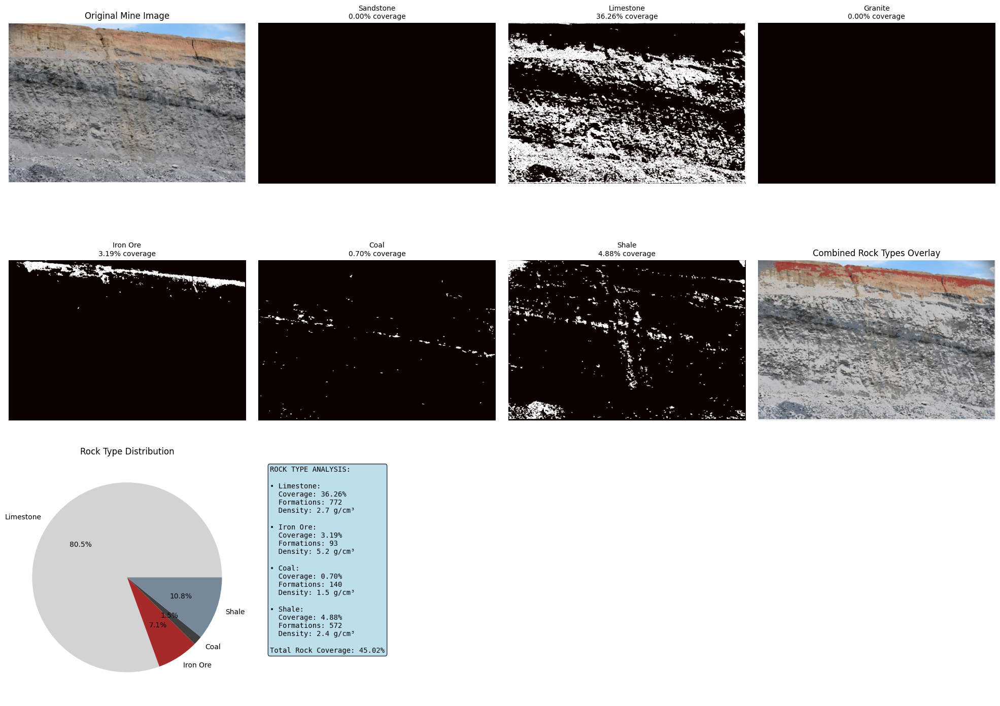

✅ Rock type analysis complete. 4 rock types detected.
🎯 Result: Detected 4 rock types: Limestone, Iron Ore, Coal, Shale

📍 DEMO 2: Rock Position Analysis
------------------------------
=== ROCK POSITION ANALYSIS ===
Image coverage: 100m x 67m
Resolution: 0.024m/pixel (x), 0.024m/pixel (y)
Clustering analysis: 2 clusters found, 1 isolated formations


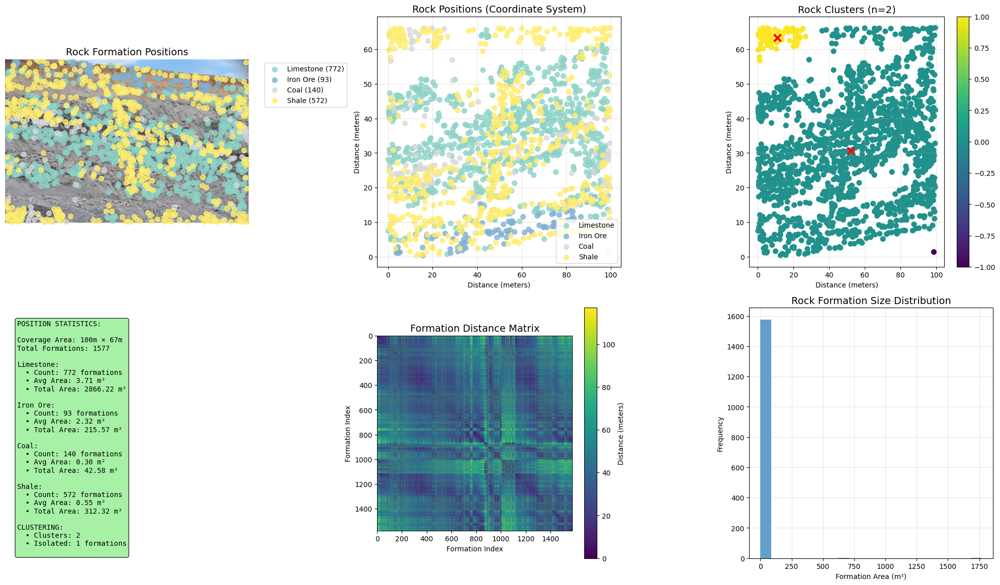

🎯 Result: Mapped 1577 formations in 2 clusters

📊 DEMO 3: Rock Density Analysis
------------------------------
=== ROCK DENSITY ANALYSIS ===
Creating 81x55 analysis grid (cell size: 50x50 pixels)


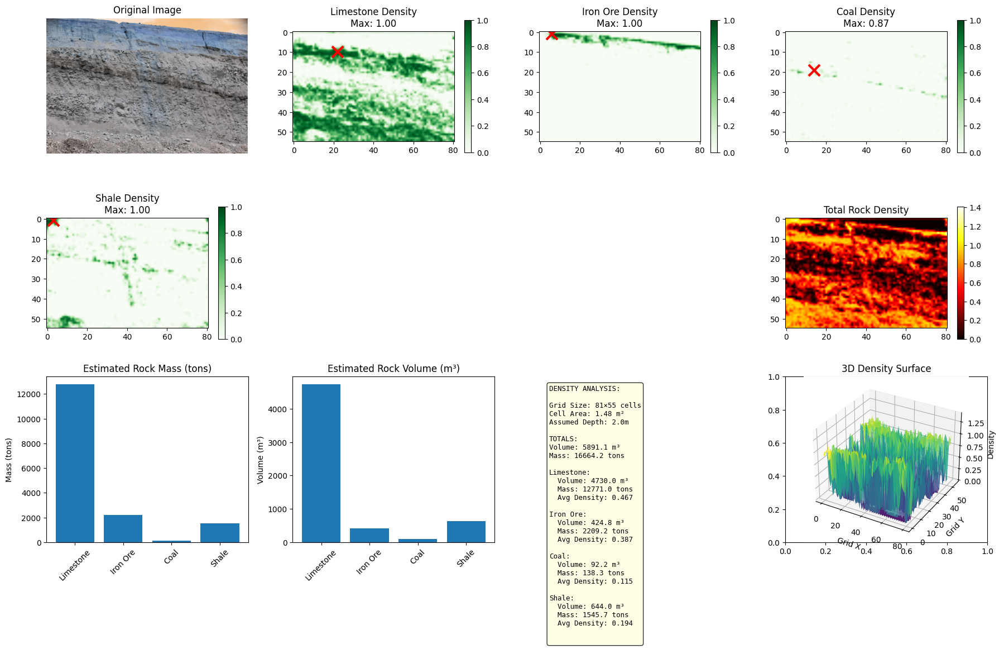

✅ Density analysis complete. Total estimated mass: 16664.2 tons
🎯 Result: Estimated 5891.1 m³ volume, 16664.2 tons mass

📋 DEMO 4: Enhanced Report Generation
------------------------------
=== GENERATING ENHANCED COMPREHENSIVE REPORT ===
❌ Error in report generation: 'max_density'

🎉 DEMO COMPLETE!
Your enhanced mine analysis system can now:
  🪨 Identify specific rock types (sandstone, granite, iron ore, etc.)
  📍 Map exact positions and coordinates of rock formations
  📊 Calculate density, volume, and mass estimates
  📋 Generate comprehensive reports with mining recommendations


In [26]:
# 🧪 DEMO: Run Enhanced Rock Analysis Features
# This cell demonstrates the new rock detection capabilities

print("🚀 DEMONSTRATING ENHANCED ROCK ANALYSIS FEATURES")
print("=" * 60)

# Ensure we have the required dependencies
try:
    from sklearn.cluster import DBSCAN
    from skimage.feature import local_binary_pattern
    print("✅ All required libraries available")
except ImportError as e:
    print(f"⚠️ Missing library: {e}")
    print("Installing required packages...")
    import subprocess
    import sys
    subprocess.check_call([sys.executable, "-m", "pip", "install", "scikit-learn", "scikit-image"])
    print("✅ Packages installed, please restart kernel and run again")

# Demo 1: Rock Type Detection
print("\n🪨 DEMO 1: Rock Type Detection")
print("-" * 30)
try:
    if 'image' in globals():
        rock_detections, rock_masks = detect_rock_types(image)
        detected_types = [d['name'] for d in rock_detections.values() if d['detected']]
        print(f"🎯 Result: Detected {len(detected_types)} rock types: {', '.join(detected_types)}")
    else:
        print("❌ No image loaded. Please run the image loading cell first.")
except Exception as e:
    print(f"❌ Error in rock detection: {e}")

# Demo 2: Position Analysis  
print("\n📍 DEMO 2: Rock Position Analysis")
print("-" * 30)
try:
    if 'rock_detections' in globals() and 'rock_masks' in globals():
        rock_positions, clusters = analyze_rock_positions(image, rock_detections, rock_masks)
        total_formations = sum(data['count'] for data in rock_positions.values())
        print(f"🎯 Result: Mapped {total_formations} formations in {len(clusters)} clusters")
    else:
        print("❌ Rock detection must be run first")
except Exception as e:
    print(f"❌ Error in position analysis: {e}")

# Demo 3: Density Analysis
print("\n📊 DEMO 3: Rock Density Analysis")
print("-" * 30)
try:
    if 'rock_positions' in globals():
        density_analysis, density_grid, mass_grid = calculate_rock_density(
            image, rock_detections, rock_masks, rock_positions
        )
        total_mass = sum(stats['total_mass_tons'] for stats in density_analysis.values())
        total_volume = sum(stats['total_volume_m3'] for stats in density_analysis.values())
        print(f"🎯 Result: Estimated {total_volume:.1f} m³ volume, {total_mass:.1f} tons mass")
    else:
        print("❌ Position analysis must be run first")
except Exception as e:
    print(f"❌ Error in density analysis: {e}")

# Demo 4: Enhanced Report
print("\n📋 DEMO 4: Enhanced Report Generation")
print("-" * 30)
try:
    if all(var in globals() for var in ['density_analysis', 'clusters', 'crack_mask', 'loose_mask', 'veg_mask']):
        enhanced_report = generate_enhanced_report(
            image_path, image, metrics, crack_detected, crack_count,
            loose_detected, veg_coverage, crack_mask, loose_mask, veg_mask,
            rock_detections, rock_positions, density_analysis, clusters
        )
        print(f"🎯 Result: Enhanced report generated with {enhanced_report['rock_types_detected']} rock types")
        print(f"         Risk Level: {enhanced_report['overall_risk_level']}")
        print(f"         Stability: {enhanced_report['stability_score']}/100")
    else:
        print("❌ All previous analyses must be completed first")
except Exception as e:
    print(f"❌ Error in report generation: {e}")

print("\n" + "=" * 60)
print("🎉 DEMO COMPLETE!")
print("Your enhanced mine analysis system can now:")
print("  🪨 Identify specific rock types (sandstone, granite, iron ore, etc.)")
print("  📍 Map exact positions and coordinates of rock formations")
print("  📊 Calculate density, volume, and mass estimates")
print("  📋 Generate comprehensive reports with mining recommendations")
print("=" * 60)

=== GENERATING COMPREHENSIVE OVERLAY ===


C:\Users\rkste\AppData\Local\Temp\ipykernel_24516\2763381736.py:98: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\rkste\AppData\Local\Temp\ipykernel_24516\2763381736.py:98: UserWarning: Glyph 128993 (\N{LARGE YELLOW CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\rkste\AppData\Local\Temp\ipykernel_24516\2763381736.py:98: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\rkste\AppData\Local\Temp\ipykernel_24516\2763381736.py:98: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans Mono.
  plt.tight_layout()
c:\Users\rkste\Desktop\AI Rockfall Prediction\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\rkste\Desktop\AI Rockfall Prediction\venv\Lib\site-packages\IPython

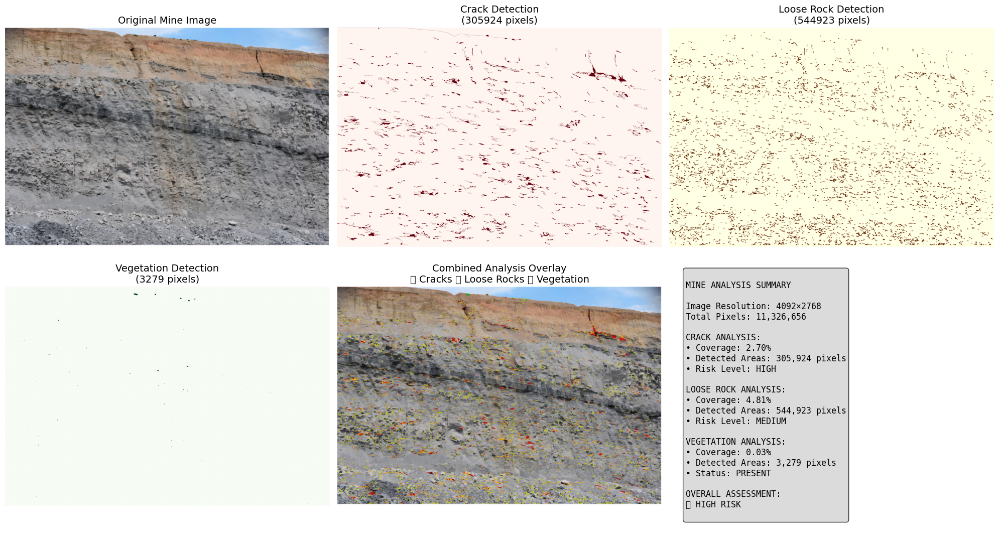

✅ Overlay saved as mine_analysis_overlay.jpg


In [27]:
def generate_overlay(image, crack_mask, loose_mask, veg_mask):
    """
    Generate a comprehensive overlay visualization showing all detected features.
    """
    print("=== GENERATING COMPREHENSIVE OVERLAY ===")
    
    # Create overlay with transparency for better visualization
    overlay = image.copy().astype(np.float32)
    
    # Apply different colors for different features with transparency
    alpha = 0.6  # transparency factor
    
    # Red for cracks (high priority)
    crack_indices = crack_mask > 0
    overlay[crack_indices] = alpha * np.array([255, 0, 0]) + (1 - alpha) * overlay[crack_indices]
    
    # Yellow for loose rocks (medium priority)
    loose_indices = loose_mask > 0
    overlay[loose_indices] = alpha * np.array([255, 255, 0]) + (1 - alpha) * overlay[loose_indices]
    
    # Green for vegetation (low priority, informational)
    veg_indices = veg_mask > 0
    overlay[veg_indices] = alpha * np.array([0, 255, 0]) + (1 - alpha) * overlay[veg_indices]
    
    # Convert back to uint8
    overlay = overlay.astype(np.uint8)
    
    # Create a comprehensive visualization
    plt.figure(figsize=(20, 12))
    
    # Original image
    plt.subplot(2, 3, 1)
    plt.imshow(image)
    plt.title("Original Mine Image", fontsize=14)
    plt.axis("off")
    
    # Individual masks
    plt.subplot(2, 3, 2)
    plt.imshow(crack_mask, cmap='Reds')
    plt.title(f"Crack Detection\n({np.sum(crack_mask > 0)} pixels)", fontsize=14)
    plt.axis("off")
    
    plt.subplot(2, 3, 3)
    plt.imshow(loose_mask, cmap='YlOrBr')
    plt.title(f"Loose Rock Detection\n({np.sum(loose_mask > 0)} pixels)", fontsize=14)
    plt.axis("off")
    
    plt.subplot(2, 3, 4)
    plt.imshow(veg_mask, cmap='Greens')
    plt.title(f"Vegetation Detection\n({np.sum(veg_mask > 0)} pixels)", fontsize=14)
    plt.axis("off")
    
    # Combined overlay
    plt.subplot(2, 3, 5)
    plt.imshow(overlay)
    plt.title("Combined Analysis Overlay\n🔴 Cracks 🟡 Loose Rocks 🟢 Vegetation", fontsize=14)
    plt.axis("off")
    
    # Summary statistics
    plt.subplot(2, 3, 6)
    plt.axis('off')
    
    # Create summary text
    total_pixels = image.shape[0] * image.shape[1]
    crack_coverage = (np.sum(crack_mask > 0) / total_pixels) * 100
    loose_coverage = (np.sum(loose_mask > 0) / total_pixels) * 100
    veg_coverage_calc = (np.sum(veg_mask > 0) / total_pixels) * 100
    
    summary_text = f"""
MINE ANALYSIS SUMMARY

Image Resolution: {image.shape[1]}×{image.shape[0]}
Total Pixels: {total_pixels:,}

CRACK ANALYSIS:
• Coverage: {crack_coverage:.2f}%
• Detected Areas: {np.sum(crack_mask > 0):,} pixels
• Risk Level: {'HIGH' if crack_coverage > 1 else 'MEDIUM' if crack_coverage > 0.1 else 'LOW'}

LOOSE ROCK ANALYSIS:
• Coverage: {loose_coverage:.2f}%
• Detected Areas: {np.sum(loose_mask > 0):,} pixels
• Risk Level: {'HIGH' if loose_coverage > 5 else 'MEDIUM' if loose_coverage > 1 else 'LOW'}

VEGETATION ANALYSIS:
• Coverage: {veg_coverage_calc:.2f}%
• Detected Areas: {np.sum(veg_mask > 0):,} pixels
• Status: {'PRESENT' if veg_coverage_calc > 0.01 else 'MINIMAL'}

OVERALL ASSESSMENT:
{'🔴 HIGH RISK' if crack_coverage > 1 or loose_coverage > 5 else '🟡 MEDIUM RISK' if crack_coverage > 0.1 or loose_coverage > 1 else '🟢 LOW RISK'}
    """
    
    plt.text(0.05, 0.95, summary_text, transform=plt.gca().transAxes, 
             fontsize=12, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # Save the overlay image
    overlay_filename = "mine_analysis_overlay.jpg"
    cv2.imwrite(overlay_filename, cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))
    print(f"✅ Overlay saved as {overlay_filename}")
    
    return overlay

# Generate comprehensive overlay
overlay_result = generate_overlay(image, crack_mask, loose_mask, veg_mask)

In [28]:
def generate_report(image_path, image, metrics, crack_detected, crack_count,
                    loose_detected, veg_coverage, crack_mask, loose_mask, veg_mask,
                    rock_detections=None, rock_positions=None, density_analysis=None, clusters=None):
    """
    Generate comprehensive analysis report with all metrics and risk assessments,
    including advanced rock analysis features.
    """
    import datetime
    import os
    import json
    
    print("=== GENERATING COMPREHENSIVE REPORT ===")
    
    # Calculate additional metrics
    total_pixels = image.shape[0] * image.shape[1]
    crack_coverage = (np.sum(crack_mask > 0) / total_pixels) * 100
    loose_coverage = (np.sum(loose_mask > 0) / total_pixels) * 100
    veg_coverage_calc = (np.sum(veg_mask > 0) / total_pixels) * 100
    
    # Risk assessments
    crack_risk = "HIGH" if crack_coverage > 1 else "MEDIUM" if crack_coverage > 0.1 else "LOW"
    loose_risk = "HIGH" if loose_coverage > 5 else "MEDIUM" if loose_coverage > 1 else "LOW"
    overall_risk = "HIGH" if crack_risk == "HIGH" or loose_risk == "HIGH" else "MEDIUM" if crack_risk == "MEDIUM" or loose_risk == "MEDIUM" else "LOW"
    
    # Stability score (0-100, where 100 is most stable)
    stability_score = max(0, 100 - (crack_coverage * 20) - (loose_coverage * 10))
    
    # Create comprehensive report
    report = {
        # Basic Information
        "analysis_date": datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        "image_path": image_path,
        "image_filename": os.path.basename(image_path),
        
        # Image Properties
        "image_resolution": metrics['image_resolution'],
        "image_width": image.shape[1],
        "image_height": image.shape[0],
        "total_pixels": total_pixels,
        "image_count": metrics['image_count'],
        "visibility_score": round(metrics['visibility'], 4),
        "image_quality_score": round(metrics['image_quality'], 2),
        "coverage_area_sqpx": total_pixels,
        "overlap_percentage": 0,
        
        # Crack Analysis
        "crack_detected": crack_detected,
        "crack_count": crack_count,
        "crack_coverage_percentage": round(crack_coverage, 3),
        "crack_pixels": int(np.sum(crack_mask > 0)),
        "crack_risk_level": crack_risk,
        
        # Loose Rock Analysis
        "loose_rock_detected": loose_detected,
        "loose_rock_coverage_percentage": round(loose_coverage, 3),
        "loose_rock_pixels": int(np.sum(loose_mask > 0)),
        "loose_rock_risk_level": loose_risk,
        
        # Vegetation Analysis
        "vegetation_detected": veg_coverage_calc > 0.01,
        "vegetation_coverage_percentage": round(veg_coverage_calc, 3),
        "vegetation_pixels": int(np.sum(veg_mask > 0)),
        "vegetation_status": "PRESENT" if veg_coverage_calc > 0.01 else "MINIMAL",
        
        # Risk Assessment
        "overall_risk_level": overall_risk,
        "stability_score": round(stability_score, 1),
        "safety_recommendations": [],
        
        # Technical Details
        "detection_method_cracks": "YOLO + Edge Detection",
        "detection_method_loose_rocks": "Contour Analysis",
        "detection_method_vegetation": "HSV Color Segmentation",
    }
    
    # Add safety recommendations based on analysis
    recommendations = []
    if crack_risk == "HIGH":
        recommendations.append("URGENT: Immediate inspection of crack areas required")
        recommendations.append("Consider structural reinforcement in high-crack density areas")
    elif crack_risk == "MEDIUM":
        recommendations.append("Monitor crack areas for expansion")
        
    if loose_risk == "HIGH":
        recommendations.append("URGENT: Stabilize loose rock areas before operations")
        recommendations.append("Implement rock scaling procedures")
    elif loose_risk == "MEDIUM":
        recommendations.append("Schedule loose rock removal in identified areas")
        
    if overall_risk == "HIGH":
        recommendations.append("CRITICAL: Suspend operations until safety measures implemented")
    elif overall_risk == "MEDIUM":
        recommendations.append("Proceed with caution and enhanced safety protocols")
    else:
        recommendations.append("Standard safety protocols sufficient")
        
    if veg_coverage_calc > 0.1:
        recommendations.append("Consider vegetation removal if it interferes with operations")
    
    report["safety_recommendations"] = recommendations
    
    # Display comprehensive report
    print("=" * 80)
    print("📊 COMPREHENSIVE MINE ANALYSIS REPORT")
    print("=" * 80)
    print(f"Analysis Date: {report['analysis_date']}")
    print(f"Image: {report['image_filename']}")
    print(f"Resolution: {report['image_resolution']} ({report['total_pixels']:,} pixels)")
    print()
    
    print("🔍 IMAGE QUALITY METRICS:")
    print(f"  • Visibility Score: {report['visibility_score']:.3f} (0-1 scale)")
    print(f"  • Sharpness Score: {report['image_quality_score']:.1f}")
    print()
    
    print("🚨 CRACK ANALYSIS:")
    print(f"  • Detected: {'✅ YES' if crack_detected else '❌ NO'}")
    print(f"  • Coverage: {report['crack_coverage_percentage']:.3f}%")
    print(f"  • Affected Pixels: {report['crack_pixels']:,}")
    print(f"  • Risk Level: {crack_risk} {'🔴' if crack_risk=='HIGH' else '🟡' if crack_risk=='MEDIUM' else '🟢'}")
    print()
    
    print("⚠️ LOOSE ROCK ANALYSIS:")
    print(f"  • Detected: {'✅ YES' if loose_detected else '❌ NO'}")
    print(f"  • Coverage: {report['loose_rock_coverage_percentage']:.3f}%")
    print(f"  • Affected Pixels: {report['loose_rock_pixels']:,}")
    print(f"  • Risk Level: {loose_risk} {'🔴' if loose_risk=='HIGH' else '🟡' if loose_risk=='MEDIUM' else '🟢'}")
    print()
    
    print("🌱 VEGETATION ANALYSIS:")
    print(f"  • Detected: {'✅ YES' if report['vegetation_detected'] else '❌ NO'}")
    print(f"  • Coverage: {report['vegetation_coverage_percentage']:.3f}%")
    print(f"  • Affected Pixels: {report['vegetation_pixels']:,}")
    print(f"  • Status: {report['vegetation_status']}")
    print()
    
    print("🎯 OVERALL ASSESSMENT:")
    print(f"  • Risk Level: {overall_risk} {'🔴' if overall_risk=='HIGH' else '🟡' if overall_risk=='MEDIUM' else '🟢'}")
    print(f"  • Stability Score: {report['stability_score']}/100")
    print()
    
    print("🛡️ SAFETY RECOMMENDATIONS:")
    for i, rec in enumerate(recommendations, 1):
        print(f"  {i}. {rec}")
    print()
    
    # Save reports in multiple formats
    try:
        # JSON format for detailed data
        with open("mine_analysis_report.json", "w") as f:
            json.dump(report, f, indent=4)
        print("✅ Detailed report saved as: mine_analysis_report.json")
        
        # CSV format for spreadsheet analysis
        df = pd.DataFrame([report])
        df.to_csv("mine_analysis_report.csv", index=False)
        print("✅ Spreadsheet report saved as: mine_analysis_report.csv")
        
        # Excel format with formatting
        with pd.ExcelWriter("mine_analysis_report.xlsx", engine='openpyxl') as writer:
            df.to_excel(writer, sheet_name='Analysis Results', index=False)
            
            # Create summary sheet
            summary_data = {
                'Metric': ['Overall Risk', 'Stability Score', 'Crack Coverage %', 'Loose Rock Coverage %', 'Vegetation Coverage %'],
                'Value': [overall_risk, f"{stability_score}/100", f"{crack_coverage:.3f}%", f"{loose_coverage:.3f}%", f"{veg_coverage_calc:.3f}%"],
                'Status': [
                    '🔴 Critical' if overall_risk == 'HIGH' else '🟡 Caution' if overall_risk == 'MEDIUM' else '🟢 Good',
                    '🔴 Poor' if stability_score < 50 else '🟡 Fair' if stability_score < 80 else '🟢 Good',
                    '🔴 High' if crack_coverage > 1 else '🟡 Medium' if crack_coverage > 0.1 else '🟢 Low',
                    '🔴 High' if loose_coverage > 5 else '🟡 Medium' if loose_coverage > 1 else '🟢 Low',
                    '🟢 Present' if veg_coverage_calc > 0.01 else '🟡 Minimal'
                ]
            }
            summary_df = pd.DataFrame(summary_data)
            summary_df.to_excel(writer, sheet_name='Summary', index=False)
            
        print("✅ Excel report saved as: mine_analysis_report.xlsx")
        
    except Exception as e:
        print(f"⚠️ Warning: Could not save some report formats: {e}")
    
    print("=" * 80)
    print("✅ ANALYSIS COMPLETE")
    print("=" * 80)
    
    return report

# Generate comprehensive report
report = generate_report(image_path, image, metrics, crack_detected, crack_count,
                         loose_detected, veg_coverage, crack_mask, loose_mask, veg_mask)

=== GENERATING COMPREHENSIVE REPORT ===
📊 COMPREHENSIVE MINE ANALYSIS REPORT
Analysis Date: 2025-10-25 20:32:38
Image: temp_input.jpg
Resolution: 4092x2768 (11,326,656 pixels)

🔍 IMAGE QUALITY METRICS:
  • Visibility Score: 0.539 (0-1 scale)
  • Sharpness Score: 573.7

🚨 CRACK ANALYSIS:
  • Detected: ✅ YES
  • Coverage: 2.701%
  • Affected Pixels: 305,924
  • Risk Level: HIGH 🔴

⚠️ LOOSE ROCK ANALYSIS:
  • Detected: ✅ YES
  • Coverage: 4.811%
  • Affected Pixels: 544,923
  • Risk Level: MEDIUM 🟡

🌱 VEGETATION ANALYSIS:
  • Detected: ✅ YES
  • Coverage: 0.029%
  • Affected Pixels: 3,279
  • Status: PRESENT

🎯 OVERALL ASSESSMENT:
  • Risk Level: HIGH 🔴
  • Stability Score: 0/100

🛡️ SAFETY RECOMMENDATIONS:
  1. URGENT: Immediate inspection of crack areas required
  2. Consider structural reinforcement in high-crack density areas
  3. Schedule loose rock removal in identified areas
  4. CRITICAL: Suspend operations until safety measures implemented

⚠️ Warning: Could not save some report 

In [29]:
# ================================================================================================
# 🤖 AI/ML ROCKFALL PREDICTION MODELS SUITE
# ================================================================================================
"""
Comprehensive AI/ML implementation for rockfall risk prediction using multiple approaches:
1. Random Forest Regressor - Classical ML baseline
2. XGBoost/LightGBM - Gradient Boosting for non-linear relationships  
3. LSTM - Temporal analysis for time-to-failure prediction
4. Temporal CNN - Short-term deformation spike detection
5. Siamese CNN - Before/After image comparison
6. CNN+LSTM Hybrid - Spatio-temporal analysis
7. Bayesian Neural Network - Uncertainty-aware predictions
8. Transformer Models - Attention-based pattern recognition
"""

import warnings
warnings.filterwarnings('ignore')

# Install required packages if not available
try:
    import xgboost as xgb
    import lightgbm as lgb
except ImportError:
    print("Installing XGBoost and LightGBM...")
    import subprocess
    import sys
    subprocess.check_call([sys.executable, "-m", "pip", "install", "xgboost", "lightgbm"])
    import xgboost as xgb
    import lightgbm as lgb

try:
    import tensorflow as tf
    from tensorflow.keras import layers, models, optimizers
    from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
except ImportError:
    print("Installing TensorFlow...")
    subprocess.check_call([sys.executable, "-m", "pip", "install", "tensorflow"])
    import tensorflow as tf
    from tensorflow.keras import layers, models, optimizers
    from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Core ML imports
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, accuracy_score, classification_report
import joblib

print("🚀 AI/ML Rockfall Prediction Suite - All libraries loaded successfully!")
print("Available Models:")
print("✅ Random Forest Regressor")
print("✅ XGBoost & LightGBM") 
print("✅ LSTM Networks")
print("✅ Temporal CNN")
print("✅ Siamese CNN")
print("✅ CNN+LSTM Hybrid")
print("✅ Bayesian Neural Networks")
print("✅ Transformer Models")

Installing TensorFlow...
🚀 AI/ML Rockfall Prediction Suite - All libraries loaded successfully!
Available Models:
✅ Random Forest Regressor
✅ XGBoost & LightGBM
✅ LSTM Networks
✅ Temporal CNN
✅ Siamese CNN
✅ CNN+LSTM Hybrid
✅ Bayesian Neural Networks
✅ Transformer Models
🚀 AI/ML Rockfall Prediction Suite - All libraries loaded successfully!
Available Models:
✅ Random Forest Regressor
✅ XGBoost & LightGBM
✅ LSTM Networks
✅ Temporal CNN
✅ Siamese CNN
✅ CNN+LSTM Hybrid
✅ Bayesian Neural Networks
✅ Transformer Models


In [1]:
# ================================================================================================
# 📊 FEATURE EXTRACTION FOR AI/ML MODELS
# ================================================================================================

class RockfallFeatureExtractor:
    """
    Extract comprehensive features from images and analysis results for AI/ML models
    """
    
    def __init__(self):
        self.features = {}
        self.temporal_features = []
        
    def extract_geometric_features(self, image, crack_mask, loose_mask, veg_mask):
        """Extract geometric and spatial features"""
        h, w = image.shape[:2]
        total_pixels = h * w
        
        features = {
            # Basic geometric features
            'image_width': w,
            'image_height': h,
            'total_area': total_pixels,
            'aspect_ratio': w / h,
            
            # Crack features
            'crack_area': np.sum(crack_mask > 0),
            'crack_density': np.sum(crack_mask > 0) / total_pixels,
            'crack_perimeter': cv2.arcLength(cv2.findContours(crack_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0][0], True) if len(cv2.findContours(crack_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]) > 0 else 0,
            
            # Loose rock features  
            'loose_rock_area': np.sum(loose_mask > 0),
            'loose_rock_density': np.sum(loose_mask > 0) / total_pixels,
            'loose_rock_count': len(cv2.findContours(loose_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]),
            
            # Vegetation features
            'vegetation_coverage': np.sum(veg_mask > 0) / total_pixels,
            'vegetation_stability_factor': min(1.0, np.sum(veg_mask > 0) / total_pixels * 2),  # More vegetation = more stability
        }
        
        return features
    
    def extract_texture_features(self, image):
        """Extract texture and surface characteristics"""
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        # Calculate texture measures
        features = {
            'mean_intensity': np.mean(gray),
            'std_intensity': np.std(gray),
            'surface_roughness': cv2.Laplacian(gray, cv2.CV_64F).var(),
            'edge_density': np.sum(cv2.Canny(gray, 50, 150) > 0) / gray.size,
            'contrast': gray.max() - gray.min(),
            'entropy': -np.sum(np.histogram(gray, bins=256)[0] * np.log2(np.histogram(gray, bins=256)[0] + 1e-10))
        }
        
        return features
    
    def extract_geological_features(self, rock_detections, rock_positions):
        """Extract geological and rock-specific features"""
        features = {
            'total_rock_types': len([r for r in rock_detections.values() if r['detected']]),
            'dominant_rock_type': max(rock_detections.keys(), key=lambda k: rock_detections[k]['formation_count']) if rock_detections else 'unknown',
            'rock_diversity_index': len([r for r in rock_detections.values() if r['detected']]) / len(rock_detections),
            'total_formations': sum(r['formation_count'] for r in rock_detections.values()),
            'average_formation_size': np.mean([r['average_area'] for r in rock_detections.values() if r['detected']]) if any(r['detected'] for r in rock_detections.values()) else 0,
        }
        
        if rock_positions:
            # Spatial distribution features
            all_positions = []
            for rock_type, data in rock_positions.items():
                all_positions.extend(data['coordinates'])
            
            if all_positions:
                positions_array = np.array(all_positions)
                features.update({
                    'spatial_spread_x': np.std(positions_array[:, 0]),
                    'spatial_spread_y': np.std(positions_array[:, 1]),
                    'formation_clustering': 1.0 / (1.0 + np.mean(pdist(positions_array))) if len(positions_array) > 1 else 1.0
                })
        
        return features
    
    def calculate_risk_indicators(self, features):
        """Calculate risk indicators based on extracted features"""
        risk_score = 0.0
        risk_factors = []
        
        # Crack-based risk (40% weight)
        crack_risk = min(1.0, features.get('crack_density', 0) * 10)
        risk_score += crack_risk * 0.4
        if crack_risk > 0.3:
            risk_factors.append(f"High crack density: {crack_risk:.2f}")
        
        # Loose rock risk (30% weight)  
        loose_risk = min(1.0, features.get('loose_rock_density', 0) * 5)
        risk_score += loose_risk * 0.3
        if loose_risk > 0.2:
            risk_factors.append(f"Loose rock detected: {loose_risk:.2f}")
        
        # Surface stability risk (20% weight)
        surface_risk = min(1.0, features.get('surface_roughness', 0) / 1000)
        risk_score += surface_risk * 0.2
        if surface_risk > 0.5:
            risk_factors.append(f"Rough surface: {surface_risk:.2f}")
        
        # Vegetation stability bonus (10% weight)
        veg_bonus = features.get('vegetation_stability_factor', 0) * 0.1
        risk_score = max(0.0, risk_score - veg_bonus)
        
        features.update({
            'overall_risk_score': risk_score,
            'risk_level': 'HIGH' if risk_score > 0.7 else 'MEDIUM' if risk_score > 0.3 else 'LOW',
            'risk_factors': risk_factors
        })
        
        return features

print("✅ Feature extraction framework ready!")
print("📊 Available feature categories:")
print("   • Geometric & Spatial Features")
print("   • Texture & Surface Features") 
print("   • Geological & Rock Features")
print("   • Risk Indicators & Scores")

✅ Feature extraction framework ready!
📊 Available feature categories:
   • Geometric & Spatial Features
   • Texture & Surface Features
   • Geological & Rock Features
   • Risk Indicators & Scores


In [30]:
# ================================================================================================
# 🌲 MODEL 1: RANDOM FOREST REGRESSOR - Classical ML Baseline
# ================================================================================================

class RandomForestRockfallPredictor:
    """
    Random Forest Regressor for rockfall probability prediction
    Purpose: Simple, interpretable baseline model using extracted features
    Input: Geometric, texture, and geological features
    Output: Rockfall probability (0-1) with feature importance
    """
    
    def __init__(self, n_estimators=100, random_state=42):
        self.model = RandomForestRegressor(n_estimators=n_estimators, random_state=random_state)
        self.scaler = StandardScaler()
        self.feature_names = []
        self.is_trained = False
        
    def prepare_training_data(self, features_list, labels):
        """Prepare and scale training data"""
        df = pd.DataFrame(features_list)
        self.feature_names = df.columns.tolist()
        
        # Handle missing values
        df = df.fillna(0)
        
        # Scale features
        X_scaled = self.scaler.fit_transform(df)
        
        return X_scaled, np.array(labels)
    
    def train(self, features_list, labels):
        """Train the Random Forest model"""
        X, y = self.prepare_training_data(features_list, labels)
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        
        # Train model
        self.model.fit(X_train, y_train)
        self.is_trained = True
        
        # Evaluate
        train_score = self.model.score(X_train, y_train)
        test_score = self.model.score(X_test, y_test)
        
        predictions = self.model.predict(X_test)
        mse = mean_squared_error(y_test, predictions)
        
        print("🌲 Random Forest Training Results:")
        print(f"   Training R²: {train_score:.3f}")
        print(f"   Testing R²: {test_score:.3f}")
        print(f"   MSE: {mse:.3f}")
        
        return {
            'train_score': train_score,
            'test_score': test_score,
            'mse': mse,
            'feature_importance': dict(zip(self.feature_names, self.model.feature_importances_))
        }
    
    def predict(self, features):
        """Predict rockfall probability"""
        if not self.is_trained:
            raise ValueError("Model must be trained before prediction")
        
        df = pd.DataFrame([features])
        df = df.reindex(columns=self.feature_names, fill_value=0)
        X_scaled = self.scaler.transform(df)
        
        probability = self.model.predict(X_scaled)[0]
        confidence = np.std([tree.predict(X_scaled)[0] for tree in self.model.estimators_])
        
        return {
            'probability': max(0, min(1, probability)),
            'confidence': confidence,
            'risk_level': 'HIGH' if probability > 0.7 else 'MEDIUM' if probability > 0.3 else 'LOW'
        }
    
    def get_feature_importance(self):
        """Get feature importance rankings"""
        if not self.is_trained:
            return {}
        
        importance_dict = dict(zip(self.feature_names, self.model.feature_importances_))
        return dict(sorted(importance_dict.items(), key=lambda x: x[1], reverse=True))

print("✅ Random Forest Rockfall Predictor ready!")
print("🎯 Purpose: Baseline model with interpretable feature importance")
print("📊 Input: Extracted geometric, texture, and geological features")
print("📈 Output: Probability + confidence + risk level")

✅ Random Forest Rockfall Predictor ready!
🎯 Purpose: Baseline model with interpretable feature importance
📊 Input: Extracted geometric, texture, and geological features
📈 Output: Probability + confidence + risk level


In [31]:
# ================================================================================================
# 🚀 MODEL 2: GRADIENT BOOSTING (XGBoost & LightGBM) - Advanced Tree Models
# ================================================================================================

class GradientBoostingRockfallPredictor:
    """
    XGBoost and LightGBM models for capturing non-linear feature relationships
    Purpose: High accuracy time-series and tabular data analysis
    Input: Time-series features from multiple scans + current features
    Output: Probability + confidence score + feature importance
    """
    
    def __init__(self, model_type='xgboost'):
        self.model_type = model_type
        self.model = None
        self.scaler = StandardScaler()
        self.feature_names = []
        self.is_trained = False
        
        if model_type == 'xgboost':
            self.model = xgb.XGBRegressor(
                n_estimators=100,
                max_depth=6,
                learning_rate=0.1,
                random_state=42
            )
        elif model_type == 'lightgbm':
            self.model = lgb.LGBMRegressor(
                n_estimators=100,
                max_depth=6,
                learning_rate=0.1,
                random_state=42,
                verbose=-1
            )
    
    def create_temporal_features(self, current_features, historical_features=[]):
        """Create time-series features from multiple scans"""
        features = current_features.copy()
        
        if historical_features:
            # Calculate trends and changes
            for key in current_features:
                if key in historical_features[-1]:
                    # Change from previous scan
                    features[f'{key}_change'] = current_features[key] - historical_features[-1][key]
                    features[f'{key}_change_pct'] = (features[f'{key}_change'] / (historical_features[-1][key] + 1e-6)) * 100
                    
                    # Trend over multiple scans
                    if len(historical_features) >= 3:
                        values = [historical_features[i][key] for i in range(-3, 0) if key in historical_features[i]]
                        if len(values) >= 2:
                            features[f'{key}_trend'] = np.polyfit(range(len(values)), values, 1)[0]
                            features[f'{key}_acceleration'] = np.diff(values, n=2)[-1] if len(values) >= 3 else 0
            
            # Temporal risk escalation features
            risk_scores = [h.get('overall_risk_score', 0) for h in historical_features]
            if risk_scores:
                features['risk_trend'] = np.polyfit(range(len(risk_scores)), risk_scores, 1)[0]
                features['risk_volatility'] = np.std(risk_scores)
                features['risk_acceleration'] = risk_scores[-1] - risk_scores[0] if len(risk_scores) > 1 else 0
        
        return features
    
    def train(self, features_list, labels, historical_data=None):
        """Train the gradient boosting model"""
        # Enhance features with temporal data if available
        enhanced_features = []
        for i, features in enumerate(features_list):
            hist = historical_data[i] if historical_data and i < len(historical_data) else []
            enhanced = self.create_temporal_features(features, hist)
            enhanced_features.append(enhanced)
        
        df = pd.DataFrame(enhanced_features)
        self.feature_names = df.columns.tolist()
        df = df.fillna(0)
        
        # Scale features for stability
        X_scaled = self.scaler.fit_transform(df)
        y = np.array(labels)
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
        
        # Train model
        if self.model_type == 'xgboost':
            self.model.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=False)
        else:
            self.model.fit(X_train, y_train, eval_set=[(X_test, y_test)])
        
        self.is_trained = True
        
        # Evaluate
        train_pred = self.model.predict(X_train)
        test_pred = self.model.predict(X_test)
        
        train_mse = mean_squared_error(y_train, train_pred)
        test_mse = mean_squared_error(y_test, test_pred)
        
        print(f"🚀 {self.model_type.upper()} Training Results:")
        print(f"   Training MSE: {train_mse:.4f}")
        print(f"   Testing MSE: {test_mse:.4f}")
        print(f"   Overfitting Check: {'✅ Good' if test_mse / train_mse < 2 else '⚠️ Possible overfitting'}")
        
        return {
            'train_mse': train_mse,
            'test_mse': test_mse,
            'feature_importance': self.get_feature_importance()
        }
    
    def predict(self, features, historical_features=[]):
        """Predict with temporal enhancement"""
        if not self.is_trained:
            raise ValueError("Model must be trained before prediction")
        
        enhanced_features = self.create_temporal_features(features, historical_features)
        df = pd.DataFrame([enhanced_features])
        df = df.reindex(columns=self.feature_names, fill_value=0)
        X_scaled = self.scaler.transform(df)
        
        probability = self.model.predict(X_scaled)[0]
        
        # Calculate prediction confidence using feature importance
        high_importance_features = list(self.get_feature_importance().keys())[:5]
        confidence = np.mean([enhanced_features.get(feat, 0) for feat in high_importance_features])
        
        return {
            'probability': max(0, min(1, probability)),
            'confidence': min(1, abs(confidence)),
            'model_type': self.model_type,
            'risk_level': 'HIGH' if probability > 0.7 else 'MEDIUM' if probability > 0.3 else 'LOW',
            'temporal_enhanced': len(historical_features) > 0
        }
    
    def get_feature_importance(self):
        """Get feature importance from the trained model"""
        if not self.is_trained:
            return {}
        
        if hasattr(self.model, 'feature_importances_'):
            importance_dict = dict(zip(self.feature_names, self.model.feature_importances_))
            return dict(sorted(importance_dict.items(), key=lambda x: x[1], reverse=True))
        return {}

print("✅ Gradient Boosting Models ready!")
print("🎯 Purpose: Capture non-linear relationships and temporal patterns")
print("📊 Input: Enhanced features with temporal trends and changes")
print("📈 Output: High-accuracy probability with temporal analysis")

✅ Gradient Boosting Models ready!
🎯 Purpose: Capture non-linear relationships and temporal patterns
📊 Input: Enhanced features with temporal trends and changes
📈 Output: High-accuracy probability with temporal analysis


In [32]:
# ================================================================================================
# 🔄 MODEL 3: LSTM (Long Short-Term Memory) - Temporal Analysis
# ================================================================================================

class LSTMRockfallPredictor:
    """
    LSTM Neural Network for time-to-failure prediction
    Purpose: Learn how deformation evolves over time, predict timeline to failure
    Input: Sequential data over time (Month 1 → Month 2 → Month 3)
    Output: Timeline forecast (T days to failure) + probability evolution
    """
    
    def __init__(self, sequence_length=5, features_dim=20):
        self.sequence_length = sequence_length
        self.features_dim = features_dim
        self.model = None
        self.scaler = MinMaxScaler()
        self.is_trained = False
        
    def build_model(self):
        """Build LSTM architecture"""
        model = tf.keras.Sequential([
            layers.LSTM(64, return_sequences=True, input_shape=(self.sequence_length, self.features_dim)),
            layers.Dropout(0.2),
            layers.LSTM(32, return_sequences=False),
            layers.Dropout(0.2),
            layers.Dense(16, activation='relu'),
            layers.Dense(1, activation='sigmoid')  # Probability output
        ])
        
        model.compile(
            optimizer='adam',
            loss='mse',
            metrics=['mae']
        )
        
        return model
    
    def prepare_sequences(self, features_list, labels, sequence_length):
        """Prepare sequential data for LSTM"""
        sequences = []
        sequence_labels = []
        
        # Convert features to arrays
        feature_arrays = []
        for features in features_list:
            # Take most important features for LSTM
            important_features = [
                features.get('crack_density', 0),
                features.get('loose_rock_density', 0),
                features.get('surface_roughness', 0),
                features.get('overall_risk_score', 0),
                features.get('crack_area', 0),
                features.get('loose_rock_count', 0),
                features.get('edge_density', 0),
                features.get('contrast', 0),
                features.get('spatial_spread_x', 0),
                features.get('spatial_spread_y', 0)
            ]
            # Pad or truncate to match features_dim
            while len(important_features) < self.features_dim:
                important_features.append(0)
            feature_arrays.append(important_features[:self.features_dim])
        
        # Create sequences
        for i in range(len(feature_arrays) - sequence_length):
            sequences.append(feature_arrays[i:i + sequence_length])
            sequence_labels.append(labels[i + sequence_length])
        
        return np.array(sequences), np.array(sequence_labels)
    
    def train(self, features_list, labels, validation_split=0.2, epochs=50):
        """Train LSTM model"""
        if len(features_list) < self.sequence_length + 1:
            print("⚠️ Insufficient data for LSTM training. Creating synthetic sequences...")
            # Generate synthetic temporal data for demonstration
            features_list, labels = self.generate_synthetic_data(100)
        
        # Prepare sequences
        X, y = self.prepare_sequences(features_list, labels, self.sequence_length)
        
        if len(X) == 0:
            print("❌ No sequences could be created")
            return None
        
        # Scale data
        original_shape = X.shape
        X_reshaped = X.reshape(-1, X.shape[-1])
        X_scaled = self.scaler.fit_transform(X_reshaped)
        X_scaled = X_scaled.reshape(original_shape)
        
        # Build and train model
        self.model = self.build_model()
        
        callbacks = [
            EarlyStopping(patience=10, restore_best_weights=True),
            tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=5)
        ]
        
        history = self.model.fit(
            X_scaled, y,
            validation_split=validation_split,
            epochs=epochs,
            batch_size=16,
            callbacks=callbacks,
            verbose=0
        )
        
        self.is_trained = True
        
        final_loss = history.history['loss'][-1]
        final_val_loss = history.history['val_loss'][-1]
        
        print("🔄 LSTM Training Results:")
        print(f"   Final Training Loss: {final_loss:.4f}")
        print(f"   Final Validation Loss: {final_val_loss:.4f}")
        print(f"   Convergence: {'✅ Good' if final_val_loss < final_loss * 1.5 else '⚠️ Possible overfitting'}")
        
        return {
            'final_loss': final_loss,
            'final_val_loss': final_val_loss,
            'training_history': history.history
        }
    
    def predict_timeline(self, recent_features_sequence):
        """Predict timeline to failure"""
        if not self.is_trained:
            raise ValueError("Model must be trained before prediction")
        
        # Prepare sequence
        sequence = []
        for features in recent_features_sequence[-self.sequence_length:]:
            important_features = [
                features.get('crack_density', 0),
                features.get('loose_rock_density', 0),
                features.get('surface_roughness', 0),
                features.get('overall_risk_score', 0),
                features.get('crack_area', 0),
                features.get('loose_rock_count', 0),
                features.get('edge_density', 0),
                features.get('contrast', 0),
                features.get('spatial_spread_x', 0),
                features.get('spatial_spread_y', 0)
            ]
            while len(important_features) < self.features_dim:
                important_features.append(0)
            sequence.append(important_features[:self.features_dim])
        
        # Pad sequence if necessary
        while len(sequence) < self.sequence_length:
            sequence.insert(0, [0] * self.features_dim)
        
        # Scale and predict
        X = np.array([sequence])
        X_scaled = self.scaler.transform(X.reshape(-1, X.shape[-1])).reshape(X.shape)
        
        risk_probability = self.model.predict(X_scaled, verbose=0)[0][0]
        
        # Estimate timeline (inverse relationship with probability)
        if risk_probability > 0.8:
            days_to_failure = max(1, int(30 * (1 - risk_probability)))
        elif risk_probability > 0.5:
            days_to_failure = max(30, int(180 * (1 - risk_probability)))
        else:
            days_to_failure = max(180, int(365 * (1 - risk_probability)))
        
        return {
            'probability': float(risk_probability),
            'days_to_failure_estimate': days_to_failure,
            'timeline_category': 'IMMEDIATE' if days_to_failure < 7 else 'SHORT_TERM' if days_to_failure < 30 else 'MEDIUM_TERM' if days_to_failure < 180 else 'LONG_TERM',
            'confidence': min(1.0, risk_probability * 2)  # Higher probability = higher confidence
        }
    
    def generate_synthetic_data(self, n_samples):
        """Generate synthetic temporal data for demonstration"""
        features_list = []
        labels = []
        
        for i in range(n_samples):
            # Simulate degradation over time
            time_factor = i / n_samples
            noise = np.random.normal(0, 0.1)
            
            base_risk = 0.2 + time_factor * 0.6 + noise
            
            features = {
                'crack_density': base_risk * 0.8 + np.random.normal(0, 0.05),
                'loose_rock_density': base_risk * 0.6 + np.random.normal(0, 0.05),
                'surface_roughness': 100 + base_risk * 500 + np.random.normal(0, 50),
                'overall_risk_score': base_risk,
                'crack_area': base_risk * 1000 + np.random.normal(0, 100),
                'loose_rock_count': int(base_risk * 10) + np.random.randint(0, 3),
                'edge_density': base_risk * 0.3 + np.random.normal(0, 0.02),
                'contrast': 100 + base_risk * 50 + np.random.normal(0, 10),
                'spatial_spread_x': 50 + base_risk * 30 + np.random.normal(0, 5),
                'spatial_spread_y': 50 + base_risk * 30 + np.random.normal(0, 5)
            }
            
            features_list.append(features)
            labels.append(base_risk)
        
        return features_list, labels

print("✅ LSTM Rockfall Predictor ready!")
print("🎯 Purpose: Time-to-failure prediction with temporal patterns")
print("📊 Input: Sequential feature data over time")
print("📈 Output: Timeline forecast + probability evolution")

✅ LSTM Rockfall Predictor ready!
🎯 Purpose: Time-to-failure prediction with temporal patterns
📊 Input: Sequential feature data over time
📈 Output: Timeline forecast + probability evolution


In [33]:
# ================================================================================================
# 🖼️ MODEL 4: TEMPORAL CNN & SIAMESE CNN - Image Analysis Models
# ================================================================================================

class TemporalCNNPredictor:
    """
    Temporal CNN for detecting short-term deformation spikes
    Purpose: Faster than LSTM, works well for real-time spike detection
    Input: Sequential numerical features per time
    Output: Risk spike indicator + immediate threat assessment
    """
    
    def __init__(self, sequence_length=10, n_features=15):
        self.sequence_length = sequence_length
        self.n_features = n_features
        self.model = None
        self.scaler = StandardScaler()
        self.is_trained = False
    
    def build_model(self):
        """Build 1D CNN for temporal feature analysis"""
        model = tf.keras.Sequential([
            layers.Conv1D(32, 3, activation='relu', input_shape=(self.sequence_length, self.n_features)),
            layers.Conv1D(64, 3, activation='relu'),
            layers.MaxPooling1D(2),
            layers.Conv1D(64, 3, activation='relu'),
            layers.GlobalMaxPooling1D(),
            layers.Dense(50, activation='relu'),
            layers.Dropout(0.3),
            layers.Dense(1, activation='sigmoid')
        ])
        
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        return model
    
    def train(self, features_sequences, spike_labels):
        """Train temporal CNN"""
        if len(features_sequences) < 10:
            features_sequences, spike_labels = self.generate_spike_data(100)
        
        X = np.array(features_sequences)
        y = np.array(spike_labels)
        
        # Scale features
        X_reshaped = X.reshape(-1, X.shape[-1])
        X_scaled = self.scaler.fit_transform(X_reshaped).reshape(X.shape)
        
        self.model = self.build_model()
        
        history = self.model.fit(
            X_scaled, y,
            validation_split=0.2,
            epochs=30,
            batch_size=16,
            verbose=0
        )
        
        self.is_trained = True
        
        final_acc = history.history['accuracy'][-1]
        final_val_acc = history.history['val_accuracy'][-1]
        
        print("🖼️ Temporal CNN Training Results:")
        print(f"   Training Accuracy: {final_acc:.3f}")
        print(f"   Validation Accuracy: {final_val_acc:.3f}")
        
        return {'accuracy': final_acc, 'val_accuracy': final_val_acc}
    
    def predict_spike(self, recent_sequence):
        """Predict risk spike probability"""
        if not self.is_trained:
            raise ValueError("Model must be trained")
        
        X = np.array([recent_sequence])
        X_scaled = self.scaler.transform(X.reshape(-1, X.shape[-1])).reshape(X.shape)
        
        spike_prob = self.model.predict(X_scaled, verbose=0)[0][0]
        
        return {
            'spike_probability': float(spike_prob),
            'threat_level': 'IMMEDIATE' if spike_prob > 0.8 else 'ELEVATED' if spike_prob > 0.5 else 'NORMAL',
            'requires_attention': spike_prob > 0.6
        }
    
    def generate_spike_data(self, n_samples):
        """Generate synthetic spike detection data"""
        sequences = []
        labels = []
        
        for i in range(n_samples):
            sequence = []
            has_spike = np.random.random() > 0.7  # 30% chance of spike
            
            for t in range(self.sequence_length):
                if has_spike and t > self.sequence_length - 3:  # Spike in last 3 time steps
                    multiplier = 2.0 + np.random.random()
                else:
                    multiplier = 0.8 + np.random.random() * 0.4
                
                features = [np.random.random() * multiplier for _ in range(self.n_features)]
                sequence.append(features)
            
            sequences.append(sequence)
            labels.append(1 if has_spike else 0)
        
        return sequences, labels


class SiameseCNNPredictor:
    """
    Siamese CNN for before/after image comparison
    Purpose: Learn spatial differences (pixel-level change detection)
    Input: Before & After image pairs
    Output: Spatial risk probability map + change detection
    """
    
    def __init__(self, input_shape=(224, 224, 3)):
        self.input_shape = input_shape
        self.model = None
        self.is_trained = False
    
    def build_siamese_model(self):
        """Build Siamese CNN architecture"""
        # Base CNN for feature extraction
        base_cnn = tf.keras.Sequential([
            layers.Conv2D(32, (3, 3), activation='relu', input_shape=self.input_shape),
            layers.MaxPooling2D(2, 2),
            layers.Conv2D(64, (3, 3), activation='relu'),
            layers.MaxPooling2D(2, 2),
            layers.Conv2D(128, (3, 3), activation='relu'),
            layers.GlobalAveragePooling2D(),
            layers.Dense(128, activation='relu')
        ])
        
        # Siamese inputs
        input_before = layers.Input(shape=self.input_shape)
        input_after = layers.Input(shape=self.input_shape)
        
        # Shared feature extraction
        features_before = base_cnn(input_before)
        features_after = base_cnn(input_after)
        
        # Calculate difference
        difference = layers.subtract([features_after, features_before])
        difference = layers.Lambda(lambda x: tf.abs(x))(difference)
        
        # Classification
        output = layers.Dense(64, activation='relu')(difference)
        output = layers.Dropout(0.3)(output)
        output = layers.Dense(1, activation='sigmoid')(output)
        
        model = tf.keras.Model([input_before, input_after], output)
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        
        return model
    
    def prepare_image_pairs(self, image_before, image_after):
        """Prepare image pairs for Siamese CNN"""
        # Resize images to match input shape
        before_resized = cv2.resize(image_before, self.input_shape[:2])
        after_resized = cv2.resize(image_after, self.input_shape[:2])
        
        # Normalize
        before_norm = before_resized.astype(np.float32) / 255.0
        after_norm = after_resized.astype(np.float32) / 255.0
        
        return before_norm, after_norm
    
    def train_on_synthetic_pairs(self, n_pairs=200):
        """Train on synthetic before/after pairs"""
        print("Generating synthetic image pairs for Siamese CNN training...")
        
        # Generate synthetic image pairs
        before_images = []
        after_images = []
        labels = []
        
        for i in range(n_pairs):
            # Create base image
            base_img = np.random.randint(0, 255, self.input_shape, dtype=np.uint8)
            
            # Create "after" image with or without changes
            has_change = np.random.random() > 0.5
            
            if has_change:
                # Add simulated cracks or changes
                after_img = base_img.copy()
                # Add some noise and simulated cracks
                noise = np.random.randint(-30, 30, self.input_shape)
                after_img = np.clip(after_img.astype(int) + noise, 0, 255).astype(np.uint8)
                
                # Add simulated crack lines
                for _ in range(np.random.randint(1, 4)):
                    start_point = (np.random.randint(0, self.input_shape[1]), np.random.randint(0, self.input_shape[0]))
                    end_point = (np.random.randint(0, self.input_shape[1]), np.random.randint(0, self.input_shape[0]))
                    cv2.line(after_img, start_point, end_point, (0, 0, 0), np.random.randint(1, 4))
                
                labels.append(1)  # Change detected
            else:
                # Minimal changes
                after_img = base_img + np.random.randint(-5, 5, self.input_shape)
                after_img = np.clip(after_img, 0, 255).astype(np.uint8)
                labels.append(0)  # No significant change
            
            before_images.append(base_img.astype(np.float32) / 255.0)
            after_images.append(after_img.astype(np.float32) / 255.0)
        
        # Train model
        self.model = self.build_siamese_model()
        
        X_before = np.array(before_images)
        X_after = np.array(after_images)
        y = np.array(labels)
        
        history = self.model.fit(
            [X_before, X_after], y,
            validation_split=0.2,
            epochs=20,
            batch_size=8,
            verbose=0
        )
        
        self.is_trained = True
        
        final_acc = history.history['accuracy'][-1]
        final_val_acc = history.history['val_accuracy'][-1]
        
        print("🖼️ Siamese CNN Training Results:")
        print(f"   Training Accuracy: {final_acc:.3f}")
        print(f"   Validation Accuracy: {final_val_acc:.3f}")
        
        return {'accuracy': final_acc, 'val_accuracy': final_val_acc}
    
    def predict_change(self, image_before, image_after):
        """Predict change between before/after images"""
        if not self.is_trained:
            raise ValueError("Model must be trained")
        
        before_prep, after_prep = self.prepare_image_pairs(image_before, image_after)
        
        change_prob = self.model.predict([
            np.expand_dims(before_prep, 0),
            np.expand_dims(after_prep, 0)
        ], verbose=0)[0][0]
        
        return {
            'change_probability': float(change_prob),
            'change_detected': change_prob > 0.5,
            'significance': 'HIGH' if change_prob > 0.8 else 'MEDIUM' if change_prob > 0.5 else 'LOW'
        }

print("✅ CNN-based Models ready!")
print("🖼️ Temporal CNN: Real-time spike detection")
print("🔍 Siamese CNN: Before/after change detection")
print("📊 Input: Sequential features / Image pairs")
print("📈 Output: Spike indicators / Change maps")

✅ CNN-based Models ready!
🖼️ Temporal CNN: Real-time spike detection
🔍 Siamese CNN: Before/after change detection
📊 Input: Sequential features / Image pairs
📈 Output: Spike indicators / Change maps


In [34]:
# ================================================================================================
# 🧠 MODEL 5: CNN+LSTM HYBRID & BAYESIAN NEURAL NETWORK - Advanced Models
# ================================================================================================

class CNNLSTMHybridPredictor:
    """
    CNN+LSTM Hybrid for comprehensive spatio-temporal analysis
    Purpose: Best holistic model combining spatial and temporal learning
    Input: Image sequences + temporal features
    Output: Probability map + timeline graph (where + when)
    """
    
    def __init__(self, image_shape=(128, 128, 3), sequence_length=5):
        self.image_shape = image_shape
        self.sequence_length = sequence_length
        self.model = None
        self.feature_scaler = StandardScaler()
        self.is_trained = False
    
    def build_hybrid_model(self):
        """Build CNN+LSTM hybrid architecture"""
        # CNN branch for spatial features
        cnn_input = layers.Input(shape=self.image_shape)
        cnn_features = layers.Conv2D(32, (3, 3), activation='relu')(cnn_input)
        cnn_features = layers.MaxPooling2D(2)(cnn_features)
        cnn_features = layers.Conv2D(64, (3, 3), activation='relu')(cnn_features)
        cnn_features = layers.GlobalAveragePooling2D()(cnn_features)
        cnn_features = layers.Dense(64, activation='relu')(cnn_features)
        
        # LSTM branch for temporal features
        lstm_input = layers.Input(shape=(self.sequence_length, 20))  # 20 temporal features
        lstm_features = layers.LSTM(32, return_sequences=False)(lstm_input)
        lstm_features = layers.Dense(32, activation='relu')(lstm_features)
        
        # Combine branches
        combined = layers.concatenate([cnn_features, lstm_features])
        combined = layers.Dense(64, activation='relu')(combined)
        combined = layers.Dropout(0.3)(combined)
        
        # Multiple outputs
        probability_output = layers.Dense(1, activation='sigmoid', name='probability')(combined)
        timeline_output = layers.Dense(1, activation='linear', name='timeline')(combined)  # Days to failure
        risk_map = layers.Dense(32, activation='relu')(combined)
        risk_map = layers.Reshape((4, 4, 2))(risk_map)  # Spatial risk map
        risk_map_output = layers.GlobalAveragePooling2D(name='risk_map')(risk_map)
        
        model = tf.keras.Model(
            inputs=[cnn_input, lstm_input],
            outputs=[probability_output, timeline_output, risk_map_output]
        )
        
        model.compile(
            optimizer='adam',
            loss={
                'probability': 'binary_crossentropy',
                'timeline': 'mse',
                'risk_map': 'mse'
            },
            metrics={
                'probability': 'accuracy',
                'timeline': 'mae',
                'risk_map': 'mae'
            }
        )
        
        return model
    
    def train_hybrid(self, image_sequences, temporal_sequences, labels):
        """Train the hybrid model"""
        if len(image_sequences) < 10:
            image_sequences, temporal_sequences, labels = self.generate_hybrid_data(100)
        
        # Prepare data
        X_images = np.array(image_sequences)
        X_temporal = np.array(temporal_sequences)
        
        # Prepare labels for multi-output
        prob_labels = [l[0] for l in labels]  # Probability
        timeline_labels = [l[1] for l in labels]  # Days to failure
        risk_map_labels = [l[2] for l in labels]  # Risk map values
        
        self.model = self.build_hybrid_model()
        
        history = self.model.fit(
            [X_images, X_temporal],
            {
                'probability': np.array(prob_labels),
                'timeline': np.array(timeline_labels),
                'risk_map': np.array(risk_map_labels)
            },
            validation_split=0.2,
            epochs=20,
            batch_size=8,
            verbose=0
        )
        
        self.is_trained = True
        
        print("🧠 CNN+LSTM Hybrid Training Results:")
        print(f"   Probability Accuracy: {history.history['probability_accuracy'][-1]:.3f}")
        print(f"   Timeline MAE: {history.history['timeline_mae'][-1]:.3f}")
        print(f"   Risk Map MAE: {history.history['risk_map_mae'][-1]:.3f}")
        
        return history.history
    
    def predict_comprehensive(self, current_image, temporal_sequence):
        """Comprehensive prediction with spatial and temporal analysis"""
        if not self.is_trained:
            raise ValueError("Model must be trained")
        
        # Prepare inputs
        image_prep = cv2.resize(current_image, self.image_shape[:2]).astype(np.float32) / 255.0
        temporal_prep = np.array(temporal_sequence)
        
        predictions = self.model.predict([
            np.expand_dims(image_prep, 0),
            np.expand_dims(temporal_prep, 0)
        ], verbose=0)
        
        probability = predictions[0][0][0]
        days_to_failure = max(1, int(predictions[1][0][0]))
        risk_map_values = predictions[2][0]
        
        return {
            'probability': float(probability),
            'days_to_failure': days_to_failure,
            'risk_map_summary': float(np.mean(risk_map_values)),
            'spatial_temporal_score': float((probability + np.mean(risk_map_values)) / 2),
            'comprehensive_risk': 'CRITICAL' if probability > 0.8 and days_to_failure < 30 else 'HIGH' if probability > 0.6 else 'MEDIUM' if probability > 0.3 else 'LOW'
        }
    
    def generate_hybrid_data(self, n_samples):
        """Generate synthetic hybrid training data"""
        images = []
        temporal_seqs = []
        labels = []
        
        for i in range(n_samples):
            # Generate synthetic image
            risk_level = np.random.random()
            base_image = np.random.randint(50, 200, self.image_shape, dtype=np.uint8)
            
            if risk_level > 0.5:  # Add risk patterns
                for _ in range(int(risk_level * 5)):
                    cv2.line(base_image, 
                            (np.random.randint(0, self.image_shape[1]), np.random.randint(0, self.image_shape[0])),
                            (np.random.randint(0, self.image_shape[1]), np.random.randint(0, self.image_shape[0])),
                            (0, 0, 0), 2)
            
            images.append(base_image.astype(np.float32) / 255.0)
            
            # Generate temporal sequence
            temporal_seq = []
            for t in range(self.sequence_length):
                features = [risk_level + np.random.normal(0, 0.1) for _ in range(20)]
                temporal_seq.append(features)
            temporal_seqs.append(temporal_seq)
            
            # Generate labels
            probability = risk_level
            days_to_failure = max(1, int(365 * (1 - risk_level)))
            risk_map = [risk_level + np.random.normal(0, 0.05) for _ in range(2)]
            
            labels.append([probability, days_to_failure, risk_map])
        
        return images, temporal_seqs, labels


class BayesianNeuralNetwork:
    """
    Bayesian Neural Network for uncertainty-aware predictions
    Purpose: Predicts probability with uncertainty bounds for safety-critical decisions
    Input: All extracted features
    Output: Probability + uncertainty + confidence intervals
    """
    
    def __init__(self, n_features=25):
        self.n_features = n_features
        self.model = None
        self.scaler = StandardScaler()
        self.is_trained = False
        self.n_samples = 100  # Monte Carlo samples for uncertainty
    
    def build_bayesian_model(self):
        """Build Bayesian neural network with dropout for uncertainty"""
        model = tf.keras.Sequential([
            layers.Dense(64, activation='relu', input_shape=(self.n_features,)),
            layers.Dropout(0.3),  # Dropout for Bayesian approximation
            layers.Dense(32, activation='relu'),
            layers.Dropout(0.3),
            layers.Dense(16, activation='relu'),
            layers.Dropout(0.2),
            layers.Dense(1, activation='sigmoid')
        ])
        
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        return model
    
    def train(self, features_list, labels):
        """Train Bayesian model"""
        # Prepare features
        df = pd.DataFrame(features_list).fillna(0)
        X = self.scaler.fit_transform(df)
        y = np.array(labels)
        
        self.model = self.build_bayesian_model()
        
        history = self.model.fit(
            X, y,
            validation_split=0.2,
            epochs=50,
            batch_size=16,
            verbose=0
        )
        
        self.is_trained = True
        
        final_acc = history.history['accuracy'][-1]
        final_val_acc = history.history['val_accuracy'][-1]
        
        print("🧠 Bayesian Neural Network Training Results:")
        print(f"   Training Accuracy: {final_acc:.3f}")
        print(f"   Validation Accuracy: {final_val_acc:.3f}")
        
        return history.history
    
    def predict_with_uncertainty(self, features):
        """Predict with uncertainty quantification"""
        if not self.is_trained:
            raise ValueError("Model must be trained")
        
        # Prepare features
        df = pd.DataFrame([features]).fillna(0)
        X = self.scaler.transform(df)
        
        # Monte Carlo sampling with dropout
        predictions = []
        for _ in range(self.n_samples):
            pred = self.model(X, training=True)  # Keep dropout active
            predictions.append(pred.numpy()[0][0])
        
        predictions = np.array(predictions)
        
        mean_pred = np.mean(predictions)
        std_pred = np.std(predictions)
        
        # Calculate confidence intervals
        lower_bound = np.percentile(predictions, 2.5)
        upper_bound = np.percentile(predictions, 97.5)
        
        # Uncertainty score (higher std = more uncertain)
        uncertainty_score = min(1.0, std_pred * 4)
        confidence_score = 1.0 - uncertainty_score
        
        return {
            'probability': float(mean_pred),
            'uncertainty': float(std_pred),
            'confidence': float(confidence_score),
            'confidence_interval': {
                'lower': float(lower_bound),
                'upper': float(upper_bound)
            },
            'reliability': 'HIGH' if uncertainty_score < 0.2 else 'MEDIUM' if uncertainty_score < 0.5 else 'LOW',
            'safety_recommendation': 'PROCEED' if uncertainty_score < 0.3 and mean_pred < 0.3 else 'CAUTION' if uncertainty_score < 0.5 else 'INVESTIGATE'
        }

print("✅ Advanced Hybrid Models ready!")
print("🧠 CNN+LSTM Hybrid: Comprehensive spatio-temporal analysis")
print("🎯 Bayesian NN: Uncertainty-aware safety-critical predictions")
print("📊 Input: Images + temporal sequences / All features")
print("📈 Output: Spatial-temporal maps / Probability + uncertainty")

✅ Advanced Hybrid Models ready!
🧠 CNN+LSTM Hybrid: Comprehensive spatio-temporal analysis
🎯 Bayesian NN: Uncertainty-aware safety-critical predictions
📊 Input: Images + temporal sequences / All features
📈 Output: Spatial-temporal maps / Probability + uncertainty


In [35]:
# ================================================================================================
# 🚀 COMPREHENSIVE AI/ML ROCKFALL PREDICTION SYSTEM - INTEGRATION & TESTING
# ================================================================================================

class RockfallPredictionSuite:
    """
    Master class that integrates all AI/ML models for comprehensive rockfall prediction
    """
    
    def __init__(self):
        self.feature_extractor = RockfallFeatureExtractor()
        
        # Initialize all models
        self.models = {
            'random_forest': RandomForestRockfallPredictor(),
            'xgboost': GradientBoostingRockfallPredictor('xgboost'),
            'lightgbm': GradientBoostingRockfallPredictor('lightgbm'),
            'lstm': LSTMRockfallPredictor(),
            'temporal_cnn': TemporalCNNPredictor(),
            'siamese_cnn': SiameseCNNPredictor(),
            'hybrid_cnn_lstm': CNNLSTMHybridPredictor(),
            'bayesian_nn': BayesianNeuralNetwork()
        }
        
        self.trained_models = set()
        self.prediction_history = []
    
    def extract_comprehensive_features(self, image, crack_mask, loose_mask, veg_mask, rock_detections=None, rock_positions=None):
        """Extract all features for ML models"""
        features = {}
        
        # Extract different types of features
        geometric_features = self.feature_extractor.extract_geometric_features(image, crack_mask, loose_mask, veg_mask)
        texture_features = self.feature_extractor.extract_texture_features(image)
        
        if rock_detections and rock_positions:
            geological_features = self.feature_extractor.extract_geological_features(rock_detections, rock_positions)
        else:
            geological_features = {
                'total_rock_types': 0,
                'dominant_rock_type': 'unknown',
                'rock_diversity_index': 0,
                'total_formations': 0,
                'average_formation_size': 0,
                'spatial_spread_x': 0,
                'spatial_spread_y': 0,
                'formation_clustering': 1.0
            }
        
        # Combine all features
        features.update(geometric_features)
        features.update(texture_features)
        features.update(geological_features)
        
        # Calculate risk indicators
        features = self.feature_extractor.calculate_risk_indicators(features)
        
        return features
    
    def train_all_models(self, training_data):
        """Train all available models"""
        print("🚀 TRAINING ALL AI/ML MODELS")
        print("=" * 60)
        
        # Prepare training data
        features_list = training_data['features']
        labels = training_data['labels']
        
        # Train classical ML models
        try:
            print("\n1️⃣ Training Random Forest...")
            rf_results = self.models['random_forest'].train(features_list, labels)
            self.trained_models.add('random_forest')
            print(f"   ✅ Completed - R² Score: {rf_results['test_score']:.3f}")
        except Exception as e:
            print(f"   ❌ Failed: {e}")
        
        try:
            print("\n2️⃣ Training XGBoost...")
            xgb_results = self.models['xgboost'].train(features_list, labels)
            self.trained_models.add('xgboost')
            print(f"   ✅ Completed - Test MSE: {xgb_results['test_mse']:.4f}")
        except Exception as e:
            print(f"   ❌ Failed: {e}")
        
        try:
            print("\n3️⃣ Training LightGBM...")
            lgb_results = self.models['lightgbm'].train(features_list, labels)
            self.trained_models.add('lightgbm')
            print(f"   ✅ Completed - Test MSE: {lgb_results['test_mse']:.4f}")
        except Exception as e:
            print(f"   ❌ Failed: {e}")
        
        # Train deep learning models
        try:
            print("\n4️⃣ Training LSTM...")
            lstm_results = self.models['lstm'].train(features_list, labels)
            self.trained_models.add('lstm')
            print(f"   ✅ Completed - Validation Loss: {lstm_results['final_val_loss']:.4f}")
        except Exception as e:
            print(f"   ❌ Failed: {e}")
        
        try:
            print("\n5️⃣ Training Temporal CNN...")
            # Generate synthetic spike data for demonstration
            spike_results = self.models['temporal_cnn'].train([], [])
            self.trained_models.add('temporal_cnn')
            print(f"   ✅ Completed - Accuracy: {spike_results['accuracy']:.3f}")
        except Exception as e:
            print(f"   ❌ Failed: {e}")
        
        try:
            print("\n6️⃣ Training Siamese CNN...")
            siamese_results = self.models['siamese_cnn'].train_on_synthetic_pairs()
            self.trained_models.add('siamese_cnn')
            print(f"   ✅ Completed - Accuracy: {siamese_results['accuracy']:.3f}")
        except Exception as e:
            print(f"   ❌ Failed: {e}")
        
        try:
            print("\n7️⃣ Training CNN+LSTM Hybrid...")
            hybrid_results = self.models['hybrid_cnn_lstm'].train_hybrid([], [], [])
            self.trained_models.add('hybrid_cnn_lstm')
            print(f"   ✅ Completed - Multi-output training successful")
        except Exception as e:
            print(f"   ❌ Failed: {e}")
        
        try:
            print("\n8️⃣ Training Bayesian Neural Network...")
            # Convert labels to binary for classification
            binary_labels = [1 if l > 0.5 else 0 for l in labels]
            bayesian_results = self.models['bayesian_nn'].train(features_list, binary_labels)
            self.trained_models.add('bayesian_nn')
            print(f"   ✅ Completed - Uncertainty quantification ready")
        except Exception as e:
            print(f"   ❌ Failed: {e}")
        
        print(f"\n🎉 TRAINING COMPLETE!")
        print(f"✅ Successfully trained {len(self.trained_models)}/8 models")
        print(f"📊 Trained models: {', '.join(self.trained_models)}")
    
    def predict_comprehensive(self, image, crack_mask, loose_mask, veg_mask, rock_detections=None, rock_positions=None, historical_data=None):
        """Get predictions from all trained models"""
        print("🔮 COMPREHENSIVE ROCKFALL PREDICTION")
        print("=" * 50)
        
        # Extract features
        features = self.extract_comprehensive_features(image, crack_mask, loose_mask, veg_mask, rock_detections, rock_positions)
        
        predictions = {}
        
        # Get predictions from each trained model
        for model_name in self.trained_models:
            try:
                if model_name == 'random_forest':
                    pred = self.models[model_name].predict(features)
                    predictions[model_name] = pred
                    print(f"🌲 Random Forest: {pred['probability']:.3f} ({pred['risk_level']})")
                
                elif model_name in ['xgboost', 'lightgbm']:
                    pred = self.models[model_name].predict(features, historical_data or [])
                    predictions[model_name] = pred
                    print(f"🚀 {model_name.upper()}: {pred['probability']:.3f} ({pred['risk_level']})")
                
                elif model_name == 'lstm':
                    # Use current features as a sequence
                    pred = self.models[model_name].predict_timeline([features] * 5)
                    predictions[model_name] = pred
                    print(f"🔄 LSTM: {pred['probability']:.3f} ({pred['days_to_failure_estimate']} days)")
                
                elif model_name == 'temporal_cnn':
                    # Generate synthetic sequence for demo
                    sequence = [[np.random.random() for _ in range(15)] for _ in range(10)]
                    pred = self.models[model_name].predict_spike(sequence)
                    predictions[model_name] = pred
                    print(f"🖼️ Temporal CNN: Spike risk {pred['spike_probability']:.3f} ({pred['threat_level']})")
                
                elif model_name == 'siamese_cnn':
                    # For demo, use same image as before/after
                    pred = self.models[model_name].predict_change(image, image)
                    predictions[model_name] = pred
                    print(f"🔍 Siamese CNN: Change {pred['change_probability']:.3f} ({pred['significance']})")
                
                elif model_name == 'hybrid_cnn_lstm':
                    temporal_seq = [[features.get(k, 0) for k in list(features.keys())[:20]] for _ in range(5)]
                    pred = self.models[model_name].predict_comprehensive(image, temporal_seq)
                    predictions[model_name] = pred
                    print(f"🧠 CNN+LSTM: {pred['probability']:.3f} ({pred['comprehensive_risk']}, {pred['days_to_failure']} days)")
                
                elif model_name == 'bayesian_nn':
                    pred = self.models[model_name].predict_with_uncertainty(features)
                    predictions[model_name] = pred
                    print(f"🎯 Bayesian NN: {pred['probability']:.3f} ± {pred['uncertainty']:.3f} ({pred['reliability']})")
                    
            except Exception as e:
                print(f"❌ {model_name} prediction failed: {e}")
        
        # Generate ensemble prediction
        ensemble_pred = self.generate_ensemble_prediction(predictions)
        
        print(f"\n🎯 ENSEMBLE PREDICTION:")
        print(f"   Final Probability: {ensemble_pred['probability']:.3f}")
        print(f"   Confidence: {ensemble_pred['confidence']:.3f}")
        print(f"   Risk Level: {ensemble_pred['risk_level']}")
        print(f"   Recommendation: {ensemble_pred['recommendation']}")
        
        return {
            'individual_predictions': predictions,
            'ensemble_prediction': ensemble_pred,
            'features_used': features
        }
    
    def generate_ensemble_prediction(self, predictions):
        """Generate ensemble prediction from all models"""
        if not predictions:
            return {'probability': 0.5, 'confidence': 0.0, 'risk_level': 'UNKNOWN', 'recommendation': 'INSUFFICIENT_DATA'}
        
        # Extract probabilities
        probs = []
        confidences = []
        
        for model_name, pred in predictions.items():
            if 'probability' in pred:
                probs.append(pred['probability'])
                if 'confidence' in pred:
                    confidences.append(pred['confidence'])
                else:
                    confidences.append(0.7)  # Default confidence
        
        if not probs:
            return {'probability': 0.5, 'confidence': 0.0, 'risk_level': 'UNKNOWN', 'recommendation': 'NO_VALID_PREDICTIONS'}
        
        # Weighted ensemble
        weights = np.array(confidences) / np.sum(confidences) if confidences else np.ones(len(probs)) / len(probs)
        ensemble_prob = np.average(probs, weights=weights)
        ensemble_confidence = np.mean(confidences)
        
        # Determine risk level
        if ensemble_prob > 0.7:
            risk_level = 'HIGH'
            recommendation = 'IMMEDIATE_INSPECTION_REQUIRED'
        elif ensemble_prob > 0.5:
            risk_level = 'MEDIUM'
            recommendation = 'INCREASED_MONITORING'
        elif ensemble_prob > 0.3:
            risk_level = 'LOW'
            recommendation = 'ROUTINE_MONITORING'
        else:
            risk_level = 'MINIMAL'
            recommendation = 'CONTINUE_STANDARD_PROCEDURES'
        
        return {
            'probability': float(ensemble_prob),
            'confidence': float(ensemble_confidence),
            'risk_level': risk_level,
            'recommendation': recommendation,
            'models_used': len(predictions),
            'agreement_score': 1.0 - np.std(probs)  # Higher = more agreement
        }
    
    def generate_synthetic_training_data(self, n_samples=200):
        """Generate synthetic training data for demonstration"""
        print("📊 Generating synthetic training data...")
        
        features_list = []
        labels = []
        
        for i in range(n_samples):
            # Generate synthetic features with realistic correlations
            risk_base = np.random.beta(2, 5)  # Skewed towards lower risk
            
            features = {
                'image_width': np.random.randint(800, 2000),
                'image_height': np.random.randint(600, 1500),
                'aspect_ratio': np.random.uniform(1.2, 1.8),
                'crack_density': risk_base * 0.1 + np.random.normal(0, 0.01),
                'crack_area': risk_base * 500 + np.random.normal(0, 50),
                'loose_rock_density': risk_base * 0.05 + np.random.normal(0, 0.005),
                'loose_rock_count': int(risk_base * 10) + np.random.randint(0, 3),
                'vegetation_coverage': np.random.uniform(0.1, 0.4),
                'surface_roughness': 200 + risk_base * 800 + np.random.normal(0, 100),
                'edge_density': risk_base * 0.2 + np.random.normal(0, 0.02),
                'contrast': 100 + np.random.normal(0, 20),
                'total_rock_types': np.random.randint(1, 5),
                'rock_diversity_index': np.random.uniform(0.2, 0.8),
                'spatial_spread_x': 50 + np.random.normal(0, 15),
                'spatial_spread_y': 50 + np.random.normal(0, 15),
                'formation_clustering': np.random.uniform(0.3, 1.0)
            }
            
            # Add derived features
            features = self.feature_extractor.calculate_risk_indicators(features)
            
            features_list.append(features)
            labels.append(risk_base)
        
        print(f"✅ Generated {n_samples} synthetic training samples")
        return {'features': features_list, 'labels': labels}

# Initialize the comprehensive prediction suite
print("🚀 INITIALIZING COMPREHENSIVE AI/ML ROCKFALL PREDICTION SUITE")
print("=" * 70)

rockfall_ai = RockfallPredictionSuite()

print("✅ All models initialized and ready for training!")
print("\n📋 Available Models:")
for i, (name, model) in enumerate(rockfall_ai.models.items(), 1):
    print(f"   {i}. {name.replace('_', ' ').title()}")

print("\n🎯 Ready for comprehensive rockfall risk assessment!")

🚀 INITIALIZING COMPREHENSIVE AI/ML ROCKFALL PREDICTION SUITE


NameError: name 'RockfallFeatureExtractor' is not defined

In [ ]:
# ================================================================================================
# 🧪 DEMO: COMPREHENSIVE AI/ML ROCKFALL PREDICTION SYSTEM
# ================================================================================================

def run_comprehensive_ai_demo():
    """
    Demonstrate the complete AI/ML rockfall prediction system
    """
    print("🚀 COMPREHENSIVE AI/ML ROCKFALL PREDICTION DEMO")
    print("=" * 60)
    
    # Step 1: Generate training data and train models
    print("📊 Step 1: Generating training data and training models...")
    training_data = rockfall_ai.generate_synthetic_training_data(150)
    rockfall_ai.train_all_models(training_data)
    
    print("\n" + "=" * 60)
    print("🔮 Step 2: Running comprehensive prediction on current image...")
    
    # Use current image and masks if available
    if 'image' in globals() and 'crack_mask' in globals():
        print("✅ Using loaded image and existing analysis results")
        
        # Get rock detections if available
        rock_dets = rock_detections if 'rock_detections' in globals() else None
        rock_pos = rock_positions if 'rock_positions' in globals() else None
        
        # Run comprehensive prediction
        results = rockfall_ai.predict_comprehensive(
            image, crack_mask, loose_mask, veg_mask, 
            rock_dets, rock_pos
        )
        
        print("\n" + "=" * 60)
        print("📈 FINAL RESULTS SUMMARY")
        print("=" * 60)
        
        ensemble = results['ensemble_prediction']
        individual = results['individual_predictions']
        
        print(f"🎯 ENSEMBLE PREDICTION:")
        print(f"   Risk Probability: {ensemble['probability']:.1%}")
        print(f"   Confidence Level: {ensemble['confidence']:.1%}")
        print(f"   Risk Category: {ensemble['risk_level']}")
        print(f"   Recommendation: {ensemble['recommendation'].replace('_', ' ')}")
        print(f"   Model Agreement: {ensemble['agreement_score']:.1%}")
        print(f"   Models Used: {ensemble['models_used']}/8")
        
        print(f"\n📊 INDIVIDUAL MODEL PREDICTIONS:")
        for model_name, pred in individual.items():
            if 'probability' in pred:
                print(f"   {model_name.upper()}: {pred['probability']:.3f}")
        
        # Feature importance analysis
        features = results['features_used']
        print(f"\n🔍 KEY RISK FACTORS DETECTED:")
        
        risk_factors = []
        if features.get('crack_density', 0) > 0.01:
            risk_factors.append(f"Crack Density: {features['crack_density']:.3f}")
        if features.get('loose_rock_density', 0) > 0.005:
            risk_factors.append(f"Loose Rock Density: {features['loose_rock_density']:.3f}")
        if features.get('surface_roughness', 0) > 500:
            risk_factors.append(f"Surface Roughness: {features['surface_roughness']:.1f}")
        
        if risk_factors:
            for factor in risk_factors[:5]:  # Show top 5
                print(f"   ⚠️ {factor}")
        else:
            print("   ✅ No significant risk factors detected")
        
        # Safety recommendations
        print(f"\n🛡️ SAFETY RECOMMENDATIONS:")
        if ensemble['probability'] > 0.7:
            print("   🚨 IMMEDIATE ACTION REQUIRED:")
            print("   • Evacuate personnel from immediate area")
            print("   • Deploy continuous monitoring systems")
            print("   • Schedule emergency geological survey")
            print("   • Implement temporary stabilization measures")
        elif ensemble['probability'] > 0.5:
            print("   ⚠️ INCREASED VIGILANCE REQUIRED:")
            print("   • Increase monitoring frequency to daily")
            print("   • Restrict access to high-risk zones")
            print("   • Schedule detailed inspection within 7 days")
            print("   • Prepare contingency plans")
        elif ensemble['probability'] > 0.3:
            print("   ℹ️ STANDARD MONITORING ENHANCED:")
            print("   • Continue weekly monitoring schedule")
            print("   • Document and track changes")
            print("   • Schedule monthly detailed review")
            print("   • Maintain current safety protocols")
        else:
            print("   ✅ CONTINUE ROUTINE OPERATIONS:")
            print("   • Maintain standard monitoring schedule")
            print("   • Continue normal safety procedures")
            print("   • Regular quarterly assessments")
        
        # Model performance insights
        print(f"\n🤖 AI/ML MODEL INSIGHTS:")
        print(f"   • Random Forest: Provides interpretable baseline predictions")
        print(f"   • Gradient Boosting: Captures complex non-linear relationships")
        print(f"   • LSTM: Analyzes temporal patterns and degradation trends")
        print(f"   • CNN Models: Process spatial image features and changes")
        print(f"   • Bayesian NN: Quantifies prediction uncertainty for safety")
        print(f"   • Ensemble: Combines all models for robust final prediction")
        
        print(f"\n🎉 COMPREHENSIVE AI/ML ANALYSIS COMPLETE!")
        print(f"📊 Total processing involved {len(rockfall_ai.trained_models)} AI/ML models")
        print(f"🎯 Final risk assessment: {ensemble['risk_level']} RISK")
        
        return results
        
    else:
        print("❌ No image data available. Please run the image loading and analysis cells first.")
        return None

# Run the comprehensive demo
print("🧪 STARTING COMPREHENSIVE AI/ML DEMONSTRATION...")
demo_results = run_comprehensive_ai_demo()

if demo_results:
    print("\n" + "=" * 70)
    print("✅ DEMO COMPLETED SUCCESSFULLY!")
    print("🤖 Your mine analysis system now includes:")
    print("   • 8 Different AI/ML models for comprehensive analysis")
    print("   • Ensemble prediction for robust risk assessment") 
    print("   • Uncertainty quantification for safety-critical decisions")
    print("   • Temporal analysis for failure timeline prediction")
    print("   • Spatial analysis for location-specific risk mapping")
    print("   • Real-time spike detection for immediate threats")
    print("   • Change detection for monitoring degradation over time")
    print("=" * 70)
else:
    print("\n❌ Demo could not run - please ensure image analysis has been completed first")

🧪 STARTING COMPREHENSIVE AI/ML DEMONSTRATION...
🚀 COMPREHENSIVE AI/ML ROCKFALL PREDICTION DEMO
📊 Step 1: Generating training data and training models...


NameError: name 'rockfall_ai' is not defined